In [2]:
# Importing imp libraies
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from IPython.display import display, HTML
display(HTML("<style>.container {width:100% !important;}</style>"))
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [3]:
# Reading the file 
churn_raw = pd.read_csv(r'C:\Users\sachd499\Downloads\telecom_churn_data.csv')

In [4]:
churn_raw.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [5]:
churn_raw.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    mobile_number             99999 non-null  int64  
 1    circle_id                 99999 non-null  int64  
 2    loc_og_t2o_mou            98981 non-null  float64
 3    std_og_t2o_mou            98981 non-null  float64
 4    loc_ic_t2o_mou            98981 non-null  float64
 5    last_date_of_month_6      99999 non-null  object 
 6    last_date_of_month_7      99398 non-null  object 
 7    last_date_of_month_8      98899 non-null  object 
 8    last_date_of_month_9      98340 non-null  object 
 9    arpu_6                    99999 non-null  float64
 10   arpu_7                    99999 non-null  float64
 11   arpu_8                    99999 non-null  float64
 12   arpu_9                    99999 non-null  float64
 13   onnet_mou_6               96062 non-null  fl

In [6]:
# Filter High value customers
# Finding the average of recharge amount for good phase 
churn_raw['avg_rech_good'] = (churn_raw['total_rech_amt_6'] + churn_raw['total_rech_amt_7'])/2

In [7]:
# Find the 70% percentile of the average
avg_rech_70 = np.percentile(churn_raw['avg_rech_good'], 70.0)

In [8]:
avg_rech_70

368.5

In [9]:
churn_raw['avg_rech_good'].quantile(0.7)

368.5

In [10]:
# Form a new dataframe churn for high value customers 
churn = churn_raw[churn_raw['avg_rech_good'] >= avg_rech_70]

In [11]:
churn.shape

(30011, 227)

In [12]:
# Getting percentage of missing values for each column
miss = round(churn.isnull().sum()/len(churn)*100,2).sort_values(ascending = False)

In [13]:
# setting options to dispaly most of the data in notebook
pd.options.display.max_rows = 300
pd.options.display.max_columns = 300

In [14]:
miss

arpu_3g_6                   62.02
count_rech_3g_6             62.02
fb_user_6                   62.02
arpu_2g_6                   62.02
night_pck_user_6            62.02
date_of_last_rech_data_6    62.02
total_rech_data_6           62.02
max_rech_data_6             62.02
av_rech_amt_data_6          62.02
count_rech_2g_6             62.02
fb_user_9                   61.81
night_pck_user_9            61.81
date_of_last_rech_data_9    61.81
total_rech_data_9           61.81
max_rech_data_9             61.81
count_rech_2g_9             61.81
arpu_2g_9                   61.81
count_rech_3g_9             61.81
arpu_3g_9                   61.81
av_rech_amt_data_9          61.81
count_rech_3g_7             61.14
arpu_2g_7                   61.14
date_of_last_rech_data_7    61.14
total_rech_data_7           61.14
fb_user_7                   61.14
av_rech_amt_data_7          61.14
max_rech_data_7             61.14
arpu_3g_7                   61.14
night_pck_user_7            61.14
count_rech_2g_

In [15]:
# Selecting all columns with greater than 40 missing values
drop_miss_cols_40 = list(miss[miss > 40].index)

In [16]:
drop_miss_cols_40

['arpu_3g_6',
 'count_rech_3g_6',
 'fb_user_6',
 'arpu_2g_6',
 'night_pck_user_6',
 'date_of_last_rech_data_6',
 'total_rech_data_6',
 'max_rech_data_6',
 'av_rech_amt_data_6',
 'count_rech_2g_6',
 'fb_user_9',
 'night_pck_user_9',
 'date_of_last_rech_data_9',
 'total_rech_data_9',
 'max_rech_data_9',
 'count_rech_2g_9',
 'arpu_2g_9',
 'count_rech_3g_9',
 'arpu_3g_9',
 'av_rech_amt_data_9',
 'count_rech_3g_7',
 'arpu_2g_7',
 'date_of_last_rech_data_7',
 'total_rech_data_7',
 'fb_user_7',
 'av_rech_amt_data_7',
 'max_rech_data_7',
 'arpu_3g_7',
 'night_pck_user_7',
 'count_rech_2g_7',
 'av_rech_amt_data_8',
 'night_pck_user_8',
 'date_of_last_rech_data_8',
 'arpu_2g_8',
 'max_rech_data_8',
 'count_rech_2g_8',
 'arpu_3g_8',
 'total_rech_data_8',
 'fb_user_8',
 'count_rech_3g_8']

In [17]:
#Dropping all columns with more than 40% missing data
churn.drop(drop_miss_cols_40, axis =1, inplace=True)

In [18]:
churn.shape

(30011, 187)

In [19]:
# Identifying all columns with date which is unnecessary and can be dropped
drop_date_cols = [i for i in churn.columns if 'date' in i]

In [20]:
drop_date_cols

['last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_date_of_month_9',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_9']

In [21]:
#Dropping all columns with dates which is irrelevant for this analysis
churn.drop(drop_date_cols, axis =1, inplace=True)

In [22]:
churn.shape

(30011, 179)

In [23]:
# checking missing values after dropping columns 
miss = round(churn.isnull().sum()/len(churn)*100,2).sort_values(ascending = False)

In [24]:
miss

loc_ic_mou_9          5.68
std_ic_mou_9          5.68
roam_ic_mou_9         5.68
loc_og_mou_9          5.68
roam_og_mou_9         5.68
std_og_mou_9          5.68
loc_og_t2t_mou_9      5.68
std_ic_t2f_mou_9      5.68
std_og_t2c_mou_9      5.68
og_others_9           5.68
loc_og_t2m_mou_9      5.68
std_og_t2f_mou_9      5.68
loc_og_t2f_mou_9      5.68
std_og_t2m_mou_9      5.68
loc_og_t2c_mou_9      5.68
std_og_t2t_mou_9      5.68
spl_og_mou_9          5.68
isd_og_mou_9          5.68
std_ic_t2o_mou_9      5.68
isd_ic_mou_9          5.68
std_ic_t2m_mou_9      5.68
spl_ic_mou_9          5.68
ic_others_9           5.68
loc_ic_t2f_mou_9      5.68
onnet_mou_9           5.68
std_ic_t2t_mou_9      5.68
loc_ic_t2t_mou_9      5.68
offnet_mou_9          5.68
loc_ic_t2m_mou_9      5.68
loc_ic_mou_8          3.13
std_ic_t2o_mou_8      3.13
std_og_t2m_mou_8      3.13
loc_ic_t2f_mou_8      3.13
std_og_t2f_mou_8      3.13
og_others_8           3.13
std_og_t2c_mou_8      3.13
loc_ic_t2m_mou_8      3.13
l

In [25]:
miss[miss > 0]

loc_ic_mou_9        5.68
std_ic_mou_9        5.68
roam_ic_mou_9       5.68
loc_og_mou_9        5.68
roam_og_mou_9       5.68
std_og_mou_9        5.68
loc_og_t2t_mou_9    5.68
std_ic_t2f_mou_9    5.68
std_og_t2c_mou_9    5.68
og_others_9         5.68
loc_og_t2m_mou_9    5.68
std_og_t2f_mou_9    5.68
loc_og_t2f_mou_9    5.68
std_og_t2m_mou_9    5.68
loc_og_t2c_mou_9    5.68
std_og_t2t_mou_9    5.68
spl_og_mou_9        5.68
isd_og_mou_9        5.68
std_ic_t2o_mou_9    5.68
isd_ic_mou_9        5.68
std_ic_t2m_mou_9    5.68
spl_ic_mou_9        5.68
ic_others_9         5.68
loc_ic_t2f_mou_9    5.68
onnet_mou_9         5.68
std_ic_t2t_mou_9    5.68
loc_ic_t2t_mou_9    5.68
offnet_mou_9        5.68
loc_ic_t2m_mou_9    5.68
loc_ic_mou_8        3.13
std_ic_t2o_mou_8    3.13
std_og_t2m_mou_8    3.13
loc_ic_t2f_mou_8    3.13
std_og_t2f_mou_8    3.13
og_others_8         3.13
std_og_t2c_mou_8    3.13
loc_ic_t2m_mou_8    3.13
loc_ic_t2t_mou_8    3.13
std_og_mou_8        3.13
std_ic_t2f_mou_8    3.13


In [26]:
# Since the columns for identifying churners has no missing values, first let us tag churners, after tagging columns for month 9 can be dropped and hence prevemnting to handle missing values 
churn['churn'] = np.where((churn['total_ic_mou_9'] == 0) & (churn['total_og_mou_9'] ==0) & (churn['vol_2g_mb_9'] == 0) & (churn['vol_3g_mb_9'] ==0),1,0)

In [27]:
churn['churn']

7        1
8        0
13       0
16       0
17       0
        ..
99970    0
99974    0
99986    0
99988    0
99997    0
Name: churn, Length: 30011, dtype: int32

In [28]:
# selecting all columns for month 9 which is churn phase and need to dropper because churn is tagged
drop_col_9 = [i for i in churn.columns if '9' in i]

In [29]:
drop_col_9

['arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_t2c_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_t2o_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'last_day_rch_amt_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 'sachet_3g_9']

In [30]:
# Dropping the columns for month 9
churn.drop(drop_col_9, axis=1, inplace=True)

In [31]:
churn.shape

(30011, 138)

In [32]:
# Checking missing data 
miss = round(churn.isnull().sum()/len(churn)*100,2).sort_values(ascending = False)

In [33]:
miss

std_og_t2m_mou_8      3.13
loc_og_t2c_mou_8      3.13
std_ic_t2m_mou_8      3.13
loc_og_t2f_mou_8      3.13
std_ic_t2o_mou_8      3.13
std_og_mou_8          3.13
loc_og_t2m_mou_8      3.13
loc_ic_t2m_mou_8      3.13
loc_og_mou_8          3.13
loc_og_t2t_mou_8      3.13
isd_og_mou_8          3.13
roam_og_mou_8         3.13
std_ic_mou_8          3.13
std_ic_t2t_mou_8      3.13
roam_ic_mou_8         3.13
spl_og_mou_8          3.13
std_ic_t2f_mou_8      3.13
offnet_mou_8          3.13
og_others_8           3.13
loc_ic_mou_8          3.13
onnet_mou_8           3.13
spl_ic_mou_8          3.13
std_og_t2t_mou_8      3.13
std_og_t2f_mou_8      3.13
loc_ic_t2f_mou_8      3.13
isd_ic_mou_8          3.13
loc_ic_t2t_mou_8      3.13
ic_others_8           3.13
std_og_t2c_mou_8      3.13
std_og_t2c_mou_6      1.05
std_ic_t2f_mou_6      1.05
og_others_6           1.05
std_og_mou_6          1.05
isd_og_mou_6          1.05
std_ic_t2m_mou_6      1.05
std_og_t2f_mou_6      1.05
std_ic_t2t_mou_6      1.05
l

In [34]:
# selecting all columns for month 9 which is churn phase
drop_col_9 = [i for i in churn.columns if 'sep' in i]

In [35]:
drop_col_9 

['sep_vbc_3g']

In [36]:
# Dropping the columns for month 9
churn.drop(drop_col_9, axis=1, inplace=True)

In [37]:
# Checking missing data after dropping month 9 columns
miss = round(churn.isnull().sum()/len(churn)*100,2).sort_values(ascending = False)

In [38]:
miss

loc_og_t2t_mou_8      3.13
roam_og_mou_8         3.13
std_og_t2c_mou_8      3.13
loc_ic_mou_8          3.13
loc_og_t2m_mou_8      3.13
loc_ic_t2f_mou_8      3.13
loc_ic_t2m_mou_8      3.13
loc_og_t2f_mou_8      3.13
loc_ic_t2t_mou_8      3.13
loc_og_t2c_mou_8      3.13
og_others_8           3.13
loc_og_mou_8          3.13
spl_og_mou_8          3.13
std_og_t2t_mou_8      3.13
isd_og_mou_8          3.13
std_og_t2m_mou_8      3.13
std_og_mou_8          3.13
std_ic_t2t_mou_8      3.13
std_og_t2f_mou_8      3.13
spl_ic_mou_8          3.13
roam_ic_mou_8         3.13
ic_others_8           3.13
std_ic_t2f_mou_8      3.13
offnet_mou_8          3.13
std_ic_t2o_mou_8      3.13
isd_ic_mou_8          3.13
onnet_mou_8           3.13
std_ic_t2m_mou_8      3.13
std_ic_mou_8          3.13
std_ic_t2m_mou_6      1.05
std_og_mou_6          1.05
ic_others_6           1.05
isd_og_mou_6          1.05
isd_ic_mou_6          1.05
spl_og_mou_6          1.05
std_ic_mou_6          1.05
spl_ic_mou_6          1.05
l

In [39]:
churn.shape

(30011, 137)

In [40]:
# Drop rows with missing values
for col in churn.columns:
    churn = churn[~churn[col].isna()]

In [41]:
churn.shape

(28861, 137)

In [42]:
miss = round(churn.isnull().sum()/len(churn)*100,2).sort_values(ascending = False)

In [43]:
miss

mobile_number         0.0
spl_ic_mou_8          0.0
std_ic_mou_8          0.0
total_ic_mou_6        0.0
total_ic_mou_7        0.0
total_ic_mou_8        0.0
spl_ic_mou_6          0.0
spl_ic_mou_7          0.0
isd_ic_mou_6          0.0
loc_ic_t2f_mou_7      0.0
isd_ic_mou_7          0.0
isd_ic_mou_8          0.0
ic_others_6           0.0
ic_others_7           0.0
ic_others_8           0.0
total_rech_num_6      0.0
std_ic_mou_7          0.0
std_ic_mou_6          0.0
std_ic_t2o_mou_8      0.0
std_ic_t2o_mou_7      0.0
std_ic_t2o_mou_6      0.0
std_ic_t2f_mou_8      0.0
std_ic_t2f_mou_7      0.0
std_ic_t2f_mou_6      0.0
std_ic_t2m_mou_8      0.0
std_ic_t2m_mou_7      0.0
std_ic_t2m_mou_6      0.0
std_ic_t2t_mou_8      0.0
std_ic_t2t_mou_7      0.0
std_ic_t2t_mou_6      0.0
loc_ic_mou_8          0.0
loc_ic_mou_7          0.0
loc_ic_mou_6          0.0
total_rech_num_7      0.0
total_rech_num_8      0.0
total_rech_amt_6      0.0
monthly_2g_8          0.0
avg_rech_good         0.0
jun_vbc_3g  

In [44]:
churn.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_good,churn
7,7000701601,109,0.0,0.0,0.0,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1185.0,1
8,7001524846,109,0.0,0.0,0.0,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,0.0,0.0,0.0,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,0
13,7002191713,109,0.0,0.0,0.0,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,0.0,0.0,0.0,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,0.0,0.0,0.0,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507

In [45]:
# Drooping circle_id as it is unnecessary for further analysis
churn.drop('circle_id', axis=1, inplace=True)

In [46]:
churn.describe()

,mobile_number,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_good,churn
count,2.886100e+04,28861.0,28861.0,28861.0,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.00000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.00000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.0,28861.0,28861.0,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.00000,28861.000000,28861.000000,28861.000000,28861.000000,28861.0,28861.0,28861.0,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000
mean,7.001229e+09,0.0,0.0,0.0,583.567951,594.558340,548.296744,296.272163,309.163947,275.867752,418.632928,431.588700,386.862307,17.350686,13.622360,13.641925,29.124845,22.141013,22.149123,96.345587,98.439796,90.381558,183.901342,185.87273,173.683376,7.124348,7.271403,6.707281,1.579216,1.878539,1.765744,287.380

In [47]:
# Getting all columns where min and max have same values and that too 0 since they add no values to model building
col_drop = []
for col in churn.columns: 
    if churn[col].max() == churn[col].min():
        col_drop.append(col)

In [48]:
col_drop

['loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_ic_t2o_mou_6',
 'std_ic_t2o_mou_7',
 'std_ic_t2o_mou_8']

In [49]:
# dropping columns with no variance at all
churn.drop(col_drop, axis=1, inplace=True)

In [50]:
churn.shape

(28861, 127)

In [51]:
churn.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28861 entries, 7 to 99997
Data columns (total 127 columns):
 #    Column              Dtype  
---   ------              -----  
 0    mobile_number       int64  
 1    arpu_6              float64
 2    arpu_7              float64
 3    arpu_8              float64
 4    onnet_mou_6         float64
 5    onnet_mou_7         float64
 6    onnet_mou_8         float64
 7    offnet_mou_6        float64
 8    offnet_mou_7        float64
 9    offnet_mou_8        float64
 10   roam_ic_mou_6       float64
 11   roam_ic_mou_7       float64
 12   roam_ic_mou_8       float64
 13   roam_og_mou_6       float64
 14   roam_og_mou_7       float64
 15   roam_og_mou_8       float64
 16   loc_og_t2t_mou_6    float64
 17   loc_og_t2t_mou_7    float64
 18   loc_og_t2t_mou_8    float64
 19   loc_og_t2m_mou_6    float64
 20   loc_og_t2m_mou_7    float64
 21   loc_og_t2m_mou_8    float64
 22   loc_og_t2f_mou_6    float64
 23   loc_og_t2f_mou_7    float64
 24   

In [52]:
# function to add derived feature to calculate the diff between the average of the good phase and the action phase which will influence the churn
def create_derived_feature(feature): 
    good_col1 = feature + '_6'
    good_col2 = feature + '_7'
    action_col = feature + '_8'
    diff_col = 'diff_' + feature
    churn[diff_col] = (churn[good_col1]+churn[good_col2])/2 - churn[action_col]
    return


In [53]:
# Creating the drived feature for arpu i.e. diff of avg arpu of 6 & 7 and arpu of 8 
create_derived_feature('arpu')

In [55]:
churn.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_good,churn,diff_arpu
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1185.0,1,-1961.9650
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,0,298.1100
13,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,380.0,0,-244.0015
16,7000875565,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,65.16,67.38,27

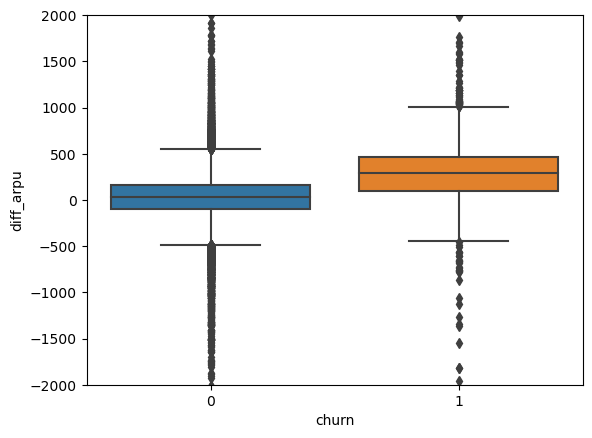

In [73]:
# Blotting the box plot of above derived feature
sns.boxplot(x= churn.churn, y = churn.diff_arpu)
plt.ylim(-2000,2000)
plt.show()


In [ ]:
# You can clearly see that the larger the difference of arpu the more chance of churing

In [59]:
# Creating the drived feature for total out going
create_derived_feature('total_og_mou')

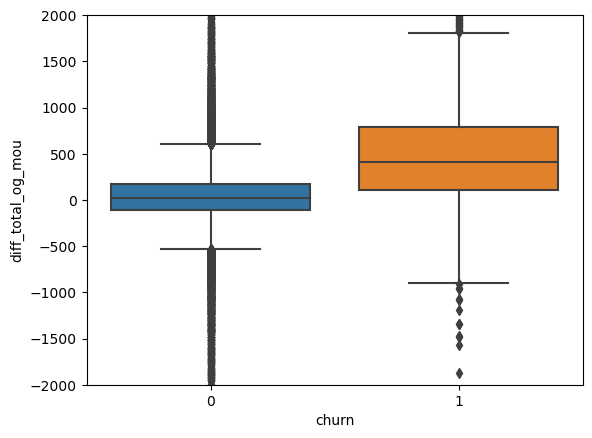

In [74]:
sns.boxplot(x= churn.churn, y = churn.diff_total_og_mou)
plt.ylim(-2000,2000)
plt.show()

In [ ]:
# You can see that higher the difference in outgoing minutes greater the chanve of churning i.e. for churners the differnce is higher whereas non churners the no of outgoing remain more or less same.

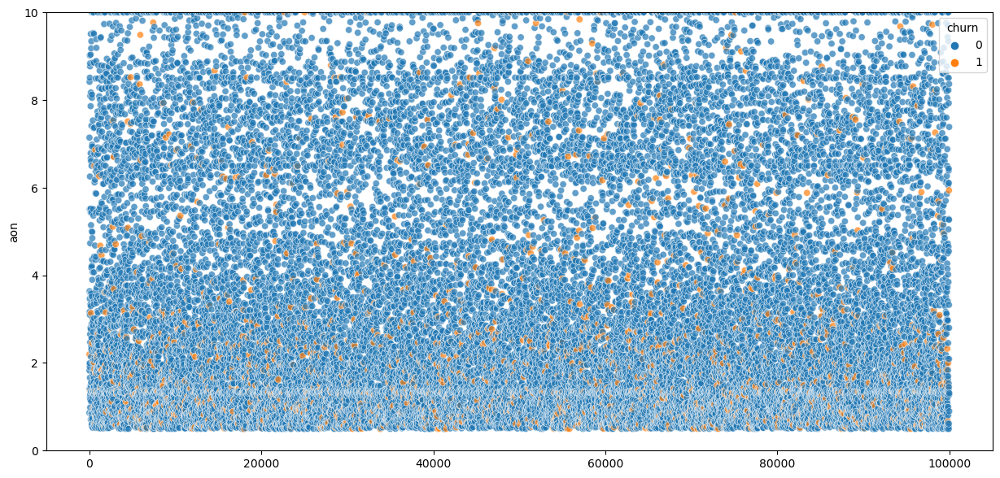

In [66]:
# plotting churn VS the age of the customer 
plt.figure(figsize=(15,7))
sns.scatterplot(y=churn['aon'] / 365, x=churn.index, hue=churn.churn, alpha=0.7)
plt.ylim(0,10)
plt.show()

In [ ]:
# you can see that modt of the churners are below the age of 4 years

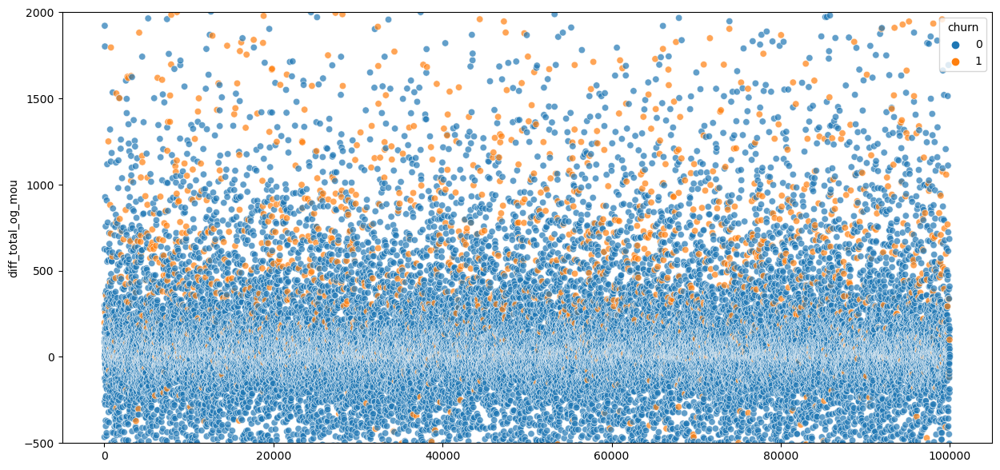

In [70]:
# plotting scatter plot for difference in outoing calls betwen avg of good phase and month 8 i.e. action phase
plt.figure(figsize=(15,7))
sns.scatterplot(y=churn['diff_total_og_mou'], x=churn.index, hue=churn.churn, alpha=0.7)
plt.ylim(-500,2000)
plt.show()

In [75]:
# Creating a function to add derived feature of diff 
def create_derived_feature_diff(feature): 
    good_col1 = feature + '_6'
    good_col2 = feature + '_7'
    action_col = feature + '_8'
    diff_col = 'diff_' + feature
    churn[diff_col] = (churn[good_col1]+churn[good_col2])/2 - churn[action_col]
    return

In [76]:
# creating a function to add derived feature of avg of good phase
def create_derived_feature_gdavg(feature): 
    good_col1 = feature + '_6'
    good_col2 = feature + '_7'
    avg_col = 'gdavg_' + feature
    churn[avg_col] = (churn[good_col1]+churn[good_col2])/2
    return

In [80]:
# creating a function to plot a scatter plot for derived feature for churn hue
def scatter(col,ylower= -10000,yhigh = 10000):
    plt.figure(figsize=(15,7))
    sns.scatterplot(y=churn[col], x=churn.index, hue=churn.churn, alpha=0.7)
    plt.ylim(ylower,yhigh)
    plt.show()
    return

In [78]:
# creating dived feature for total incoming calls
create_derived_feature_diff('total_ic_mou')

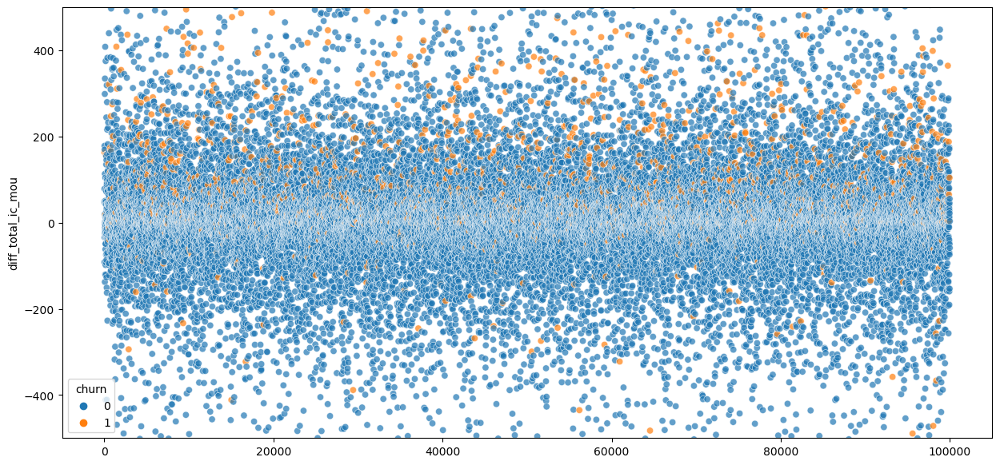

In [86]:
# plotting a scatter plot for diff in total incoming calls 
scatter('diff_total_ic_mou', -500, 500)

In [ ]:
# you can clearly see that churners have positive difference 

In [87]:
# finding all teh total columns
total = [i for i in churn.columns if 'total' in i]

In [88]:
total 

['total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'total_ic_mou_6',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'total_rech_num_6',
 'total_rech_num_7',
 'total_rech_num_8',
 'total_rech_amt_6',
 'total_rech_amt_7',
 'total_rech_amt_8',
 'diff_total_og_mou',
 'diff_total_ic_mou']

In [112]:
# Creating a derived featire for total recharge number the difference between good and action phase
create_derived_feature_diff('total_rech_num')

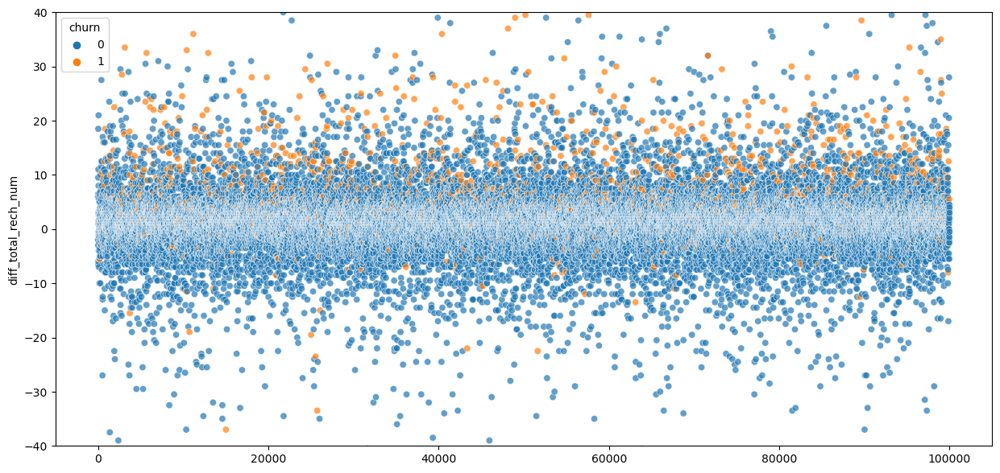

In [116]:
# plotting a scatter plot
scatter('diff_total_rech_num', -40, 40)

In [ ]:
# You can clearly see that most churners have positive difference 

In [117]:
# Creating a derived featire for total recharge amount the difference between good and action phase
create_derived_feature_diff('total_rech_amt')

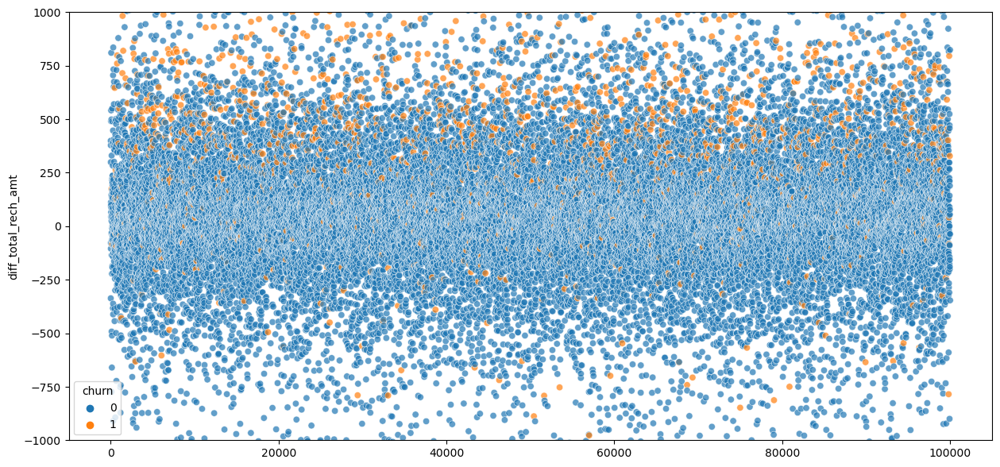

In [120]:
# plaotting the scatter plot 
scatter('diff_total_rech_amt', -1000, 1000)

In [129]:
# Creating a function for bivariate analysis
def scatter_bi(col1,col2):
    plt.figure(figsize=(10,5))
    sns.scatterplot(y=churn[col1], x=churn[col2], hue=churn.churn, alpha=0.7)
    plt.ylim(0,5000)
    plt.xlim(0,5000)
    plt.show()
    return

In [122]:
# Creating teh derived feature for average arpu for good phase
create_derived_feature_gdavg('arpu')

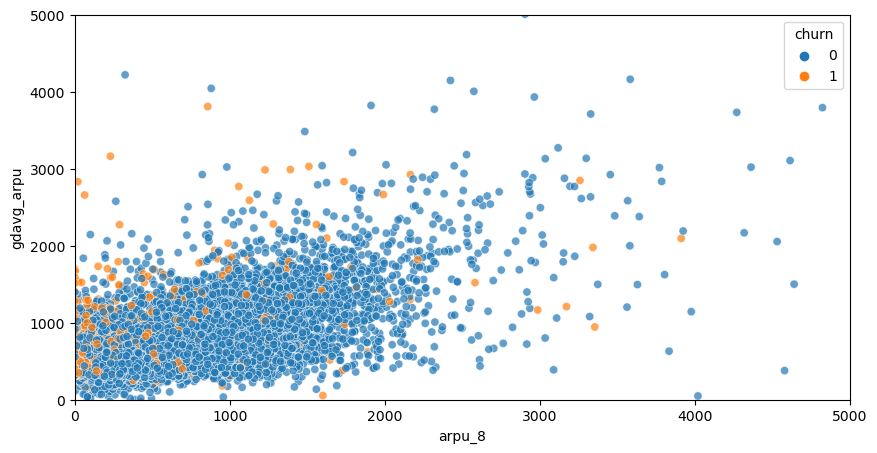

In [130]:
# plotting a scatter plot for good and action phase arpu with hue as churn
scatter_bi('gdavg_arpu', 'arpu_8')

In [ ]:
# you can clearly see that most of the churners who a high arpu in good phase have a low arpu in action phase 

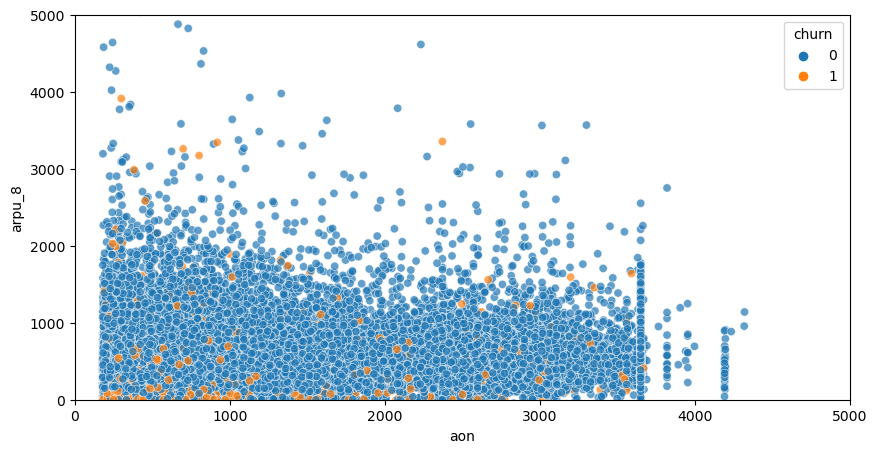

In [132]:
# plotting a scatter plot of age and arpu of month 8 
scatter_bi('arpu_8', 'aon')

In [ ]:
# no clear pattern but similar obervation as previous observations 

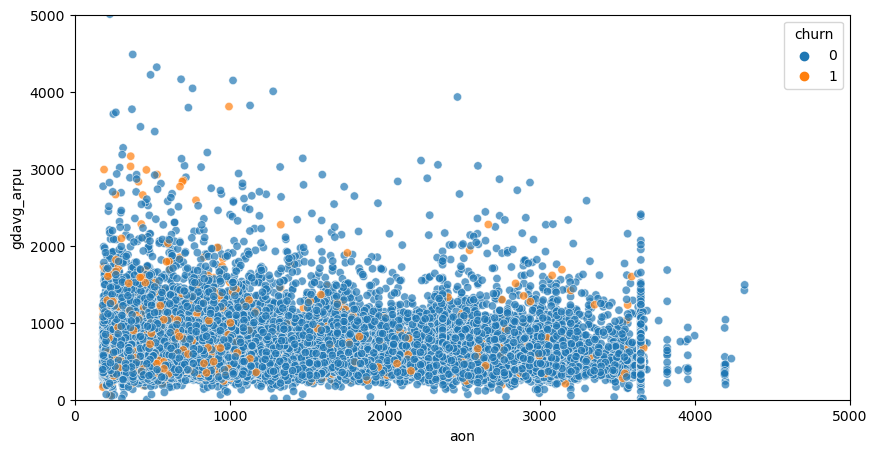

In [133]:
# plotting arpu of good phase vs age 
scatter_bi('gdavg_arpu', 'aon')

In [ ]:
# no clear pattern but same observations as above 

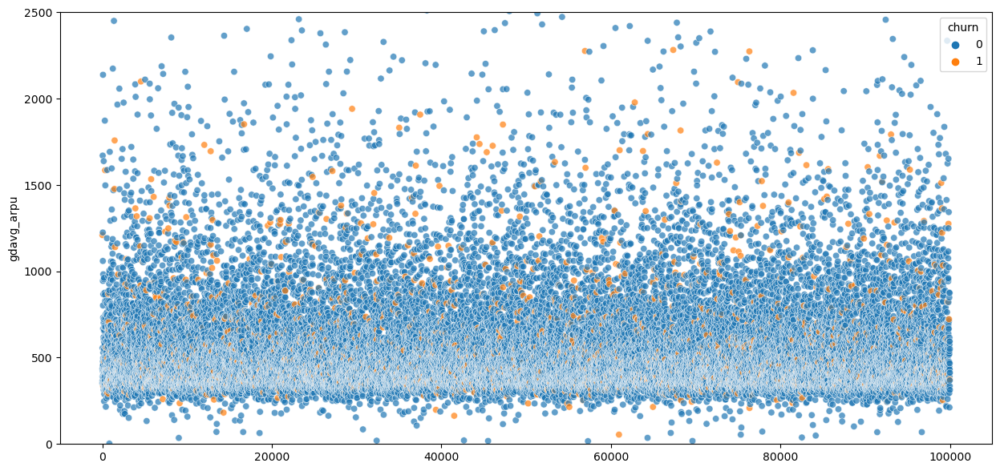

In [135]:
# plaooting scatter plot of churners vs the average arpu of good phase
scatter('gdavg_arpu',0,2500)

In [ ]:
# no clear pattern but same observations as above 

In [90]:
churn.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_good,churn,diff_arpu,diff_total_og_mou,diff_total_ic_mou
count,2.886100e+04,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.00000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.00000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.00000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000
mean,7.001229e+09,583.567951,594.558340,548.296744,296.272163,309.163947,275.867752,418.632928,431.588700,386.862307,17.350686,13.622360,13.641925,29.124845,22.141013,22.149123,96.345587,98.439796,90.381558,183.901342,185.87273,173.683376,7.124348,7.271403,6.707281,1.579216,1.878539,1.765744,287.38021,291.593068,270.780934,188.470207,201.959683,176.959112,201.182936,216.136208,184.471419,2.034966,2.073900,1.849584,391.692477,420.174180,363.28

In [103]:
# checking paraneters with low variance i.e. 75th percentile to be 0 as they dont add much value 
lv = []
for col in churn.columns: 
    if churn[col].quantile(0.75) == 0:
        lv.append(col)    

In [104]:
len(lv)

38

In [105]:
lv

['roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2c_mou_6',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'spl_ic_mou_6',
 'spl_ic_mou_7',
 'spl_ic_mou_8',
 'isd_ic_mou_6',
 'isd_ic_mou_7',
 'isd_ic_mou_8',
 'vol_3g_mb_6',
 'vol_3g_mb_8',
 'monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'sachet_2g_6',
 'sachet_2g_7',
 'sachet_2g_8',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8',
 'sachet_3g_6',
 'sachet_3g_7',
 'sachet_3g_8',
 'jun_vbc_3g',
 'churn']

In [106]:
lv.remove('churn')

In [137]:
# only considering where the variance is low for all months and hence removing below from the list of unnecessary columns
lv.remove('loc_og_t2c_mou_6')

In [138]:
lv.remove('vol_3g_mb_6')

In [139]:
lv.remove('vol_3g_mb_8')

In [140]:
lv.remove('jun_vbc_3g')

In [141]:
# collecting all derived features created for analysis
df = [i for i in churn.columns if 'diff' in i or 'avg' in i]

In [142]:
df

['avg_rech_good',
 'diff_arpu',
 'diff_total_og_mou',
 'diff_total_ic_mou',
 'diff_total_rech_num',
 'diff_total_rech_amt',
 'gdavg_arpu']

In [143]:
churn.shape

(28861, 133)

In [145]:
# dropping columns unnessary with low variance
churn.drop(lv, axis=1, inplace = True)

In [146]:
# dropping derived featuires since they will have high correlation 
churn.drop(df, axis=1, inplace=True)

In [147]:
churn.shape

(28861, 93)

In [149]:
# checking the correlation matrix
churn.corr()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
mobile_number,1.000000,0.017398,0.006027,0.013853,-0.010205,-0.015987,-0.013285,-0.000208,-0.012436,-0.002064,0.042134,0.039833,0.039306,0.073461,0.069438,0.073972,0.049738,0.050533,0.053948,-0.019269,-0.019418,-0.016650,0.077564,0.073908,0.075719,-0.036574,-0.042014,-0.036725,-0.046854,-0.052001,-0.045070,-0.056121,-0.063633,-0.054637,-0.027375,-0.030679,-0.024491,-0.007348,-0.019689,-0.009539,0.027184,0.022397,0.024806,0.061630,0.055209,0.057560,0.052111,0.051079,0.050482,0.065400,0.058458,0.060662,-0.008797,-0.004520,-0.009135,-0.021681,-0.023467,-0.023268,0.013494,0.009754,0.012139,-0.018609,-0.017879,-0.020346,0.051942,0.044479,0.045029,0.013444,0.011902,0.012254,-0.047454,-0.062737,-0.057946,0.016846,0.010090,0.012586,0.063694,0.055223,0.057719,0.049449,0.052041,0.045376,-0.006957,-0.015438,-0.013760,-0.005068,0.001142,0.004311,0.314854,-0.023467,-0.020257,-0.028435,-0.027325
arpu_6,0.017398,1.000000,0.685471,0.629757,0.295569,0.159554,0.135080,0.469624,0.282519,0.238216,0.131852,0.093841,0.093961,0.284250,0.191046,0.172433,0.116345,0.090586,0.080784,0.043329,0.011219,0.007470,0.275992,0.189958,0.175514,0.238017,0.113859,0.089518,0.266052,0.134200,0.101520,0.343370,0.169634,0.129029,0.114344,0.055952,0.029697,0.512906,0.296590,0.242572,0.067029,0.043966,0.047727,0.156181,0.116175,0.098920,0.043567,0.029818,0.030138,0.151558,0.109060,0.098726,0.067296,0.047563,0.047025,0.077540,0.047470,0.045332,0.026229,0.024618,0.017696,0.097459,0.064106,0.060586,0.188725,0.133941,0.122121,0.014596,0.026416,0.010574,0.332072,0.120344,0.108511,0.938991,0.665445,0.620500,0.303155,0.268456,0.289108,0.232359,0.192158,0.188079,0.030662,0.002826,0.007607,0.213279,0.149043,0.150566,-0.004196,0.132103,0.135373,0.175008,0.030845
arpu_7,0.006027,0.685471,1.000000,0.751948,0.151416,0.266310,0.215248,0.294880,0.439972,0.343170,0.064665,0.118180,0.097879,0.154813,0.240906,0.196041,0.084098,0.107715,0.089546,0.006278,0.037125,0.029286,0.147086,0.239040,0.193647,0.120674,0.217538,0.175501,0.162393,0.269491,0.201809,0.193032,0.332681,0.254400,0.059226,0.097956,0.050145,0.296300,0.482496,0.368018,0.025530,0.052321,0.051476,0.076498,0.128117,0.105193,0.019162,0.030525,0.029497,0.070181,0.121945,0.104990,0.044073,0.069246,0.074008,0.047069,0.077843,0.069075,0.023674,0.031219,0.025384,0.062089,0.098892,0.093296,0.097735,0.165983,0.141591,0.004023,0.024033,0.014269,0.144441,0.284076,0.198232,0.686073,0.937995,0.748889,0.257797,0.334861,0.359097,0.235124,0.254510,0.231442,0.004347,0.031734,0.023954,0.142175,0.230995,0.179153,-0.023491,0.145196,0.170457,0.120452,0.010737
arpu_8,0.013853,0.629757,0.751948,1.000000,0.103078,

In [177]:
# Identifying high correlated parameters with a threshold of 0.8
l=[]
t = []
corr_matrix = churn.corr().abs()

for ci in corr_matrix.columns: 
    for cj in corr_matrix.columns: 
        if (corr_matrix[ci][cj]>0.8 and ci!=cj) and ci+cj not in t and cj+ci not in t:
            t.append(ci+cj)
            l.append(ci)
            print(ci)
            print(cj)
            print('------')
            
l = np.array(l)
to_drop = np.unique(l)

arpu_6
total_rech_amt_6
------
arpu_7
total_rech_amt_7
------
arpu_8
total_rech_amt_8
------
onnet_mou_6
std_og_t2t_mou_6
------
onnet_mou_7
std_og_t2t_mou_7
------
onnet_mou_8
std_og_t2t_mou_8
------
offnet_mou_6
std_og_t2m_mou_6
------
offnet_mou_7
std_og_t2m_mou_7
------
offnet_mou_8
std_og_t2m_mou_8
------
loc_og_t2t_mou_7
loc_og_t2t_mou_8
------
loc_og_t2m_mou_7
loc_og_t2m_mou_8
------
loc_og_t2f_mou_6
loc_og_t2f_mou_7
------
loc_og_mou_7
loc_og_mou_8
------
std_og_mou_6
total_og_mou_6
------
std_og_mou_7
total_og_mou_7
------
std_og_mou_8
total_og_mou_8
------
loc_ic_t2m_mou_6
loc_ic_t2m_mou_7
------
loc_ic_t2m_mou_6
loc_ic_mou_6
------
loc_ic_t2m_mou_7
loc_ic_t2m_mou_8
------
loc_ic_t2m_mou_7
loc_ic_mou_7
------
loc_ic_t2m_mou_8
loc_ic_mou_8
------
loc_ic_mou_6
loc_ic_mou_7
------
loc_ic_mou_6
total_ic_mou_6
------
loc_ic_mou_7
loc_ic_mou_8
------
loc_ic_mou_7
total_ic_mou_7
------
loc_ic_mou_8
total_ic_mou_8
------
std_ic_t2m_mou_6
std_ic_mou_6
------
std_ic_t2m_mou_7
std_ic_mo

In [178]:
to_drop = list(to_drop)

In [180]:
len(to_drop)

27

In [181]:
# only considering those which make sense after analsysis.
to_drop_col = ['arpu_6', 'arpu_7', 'arpu_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8','loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7','loc_ic_t2m_mou_8','total_ic_mou_6','total_ic_mou_7', 'total_ic_mou_8','std_ic_t2m_mou_6','std_ic_t2m_mou_7','std_ic_t2m_mou_6' ]

In [171]:
total = [i for i in churn.columns if 'total' in i]

In [172]:
total

['total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'total_ic_mou_6',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'total_rech_num_6',
 'total_rech_num_7',
 'total_rech_num_8',
 'total_rech_amt_6',
 'total_rech_amt_7',
 'total_rech_amt_8']

In [173]:
rech = [i for i in churn.columns if 'rech' in i]

In [174]:
rech

['total_rech_num_6',
 'total_rech_num_7',
 'total_rech_num_8',
 'total_rech_amt_6',
 'total_rech_amt_7',
 'total_rech_amt_8',
 'max_rech_amt_6',
 'max_rech_amt_7',
 'max_rech_amt_8']

In [182]:
to_drop_col

['arpu_6',
 'arpu_7',
 'arpu_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'total_ic_mou_6',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'std_ic_t2m_mou_6',
 'std_ic_t2m_mou_7',
 'std_ic_t2m_mou_6']

In [183]:
churn.shape

(28861, 93)

In [184]:
# dropping highly correlated parameters
churn.drop(to_drop_col, axis=1,inplace=True)

In [185]:
churn.shape

(28861, 73)

In [186]:
# checking correllation after dropping
l=[]
t = []
corr_matrix = churn.corr().abs()

for ci in corr_matrix.columns: 
    for cj in corr_matrix.columns: 
        if (corr_matrix[ci][cj]>0.8 and ci!=cj) and ci+cj not in t and cj+ci not in t:
            t.append(ci+cj)
            l.append(ci)
            print(ci)
            print(cj)
            print('------')
            
l = np.array(l)
to_drop = np.unique(l)

loc_og_t2t_mou_7
loc_og_t2t_mou_8
------
loc_og_t2m_mou_7
loc_og_t2m_mou_8
------
loc_og_t2f_mou_6
loc_og_t2f_mou_7
------
loc_og_mou_7
loc_og_mou_8
------
loc_ic_mou_6
loc_ic_mou_7
------
loc_ic_mou_7
loc_ic_mou_8
------
std_ic_t2m_mou_8
std_ic_mou_8
------


In [187]:
# due to typo below was missed and hence now dropping
churn.drop('std_ic_t2m_mou_8', axis=1, inplace=True)

In [188]:
churn.shape

(28861, 72)

In [ ]:
# Now reduced to 72 parameters

In [189]:
churn.describe()

,mobile_number,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
count,2.886100e+04,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.00000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.00000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000
mean,7.001229e+09,296.272163,309.163947,275.867752,418.632928,431.588700,386.862307,96.345587,98.439796,90.381558,183.901342,185.87273,173.683376,7.124348,7.271403,6.707281,1.579216,1.878539,1.765744,287.38021,291.593068,270.780934,5.926283,7.534818,7.103449,687.764163,721.502555,643.273536,69.708836,72.222012,68.354882,15.910297,16.933993,15.246739,247.315538,254.085904,242.882597,16.236961,17.194804,15.508258,2.925032,3.074554,2.776951,51.292279,54.474460,49.755964,1.181635,1.508592,1.278569,12.110599,12.067704,10.501680,693.514708,702.434670,629.444822,169.892485,174.536849,165.679914,103.353314,105.650878,97.262673,79.722018,79.749258,70.983322,245.865718,270.539754,265.904946,1282.079623,131.467313,135.590886,119.940718,0.062610
std,6.815539e+05,457.342129,481.606078,468.949151,464.792017,487.782977,477.771854,238.829751,251.789584,238.677585,249.824060,242.50633,237.067079,22.974610,22.887120,20.544606,6.926107,9.300287,7.521652,381.08472,379.197152,370.138580,18.694921,23.305532,23.252251,652.526892,683.399708,683.901557,158.004199,169.447538,158.167837,46.255377,50.152687,44.449049,309.531384,317.689731,309.677852,79.384016,85.991851,73.341530,20.126300,20.864111,20.647581,140.582632,151.393139,143.119429,14.051132,15.652311,13.121805,9.408377,9.623649,9.493648,527.560914,560.030217,598.630618,170.742266,175.386903,169.583291,138.949900,138.036961,143.230881,278.998246,283.287740,270.817247,787.407542,820.016509,824.477412,979.491440,391.948111,408.958655,386.301550,0.242265
min,7.000000e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

In [ ]:
# We can observe there are a lot of outliers since there is a huge gap between the 75% percentile and max value

In [190]:
cols_out = list(churn.columns)

In [191]:
cols_out.remove('churn')

In [192]:
cols_out.remove('mobile_number')

In [193]:
# defining a function to do outlier treatment of all columns
def cap_outliers(array):
    q1 = np.quantile(array,0.1)
    q3 = np.quantile(array, 0.9)
    iqr = q3-q1
    upper_limit =  q3+1.5*iqr
    lower_limit =  q1-1.5*iqr
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

In [194]:
# applying capping to treat outliers 
churn[cols_out] = churn[cols_out].apply(cap_outliers, axis=0)

In [195]:
churn.describe()

,mobile_number,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
count,2.886100e+04,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000,28861.000000
mean,7.001229e+09,285.390250,298.059186,261.981719,409.641613,421.080271,375.774163,78.871768,80.018868,74.112836,177.778843,180.745294,168.645046,5.582056,5.743128,5.230593,1.022993,1.226517,1.161336,277.916229,281.955832,262.377881,4.807861,6.207551,5.763471,680.566103,713.181236,634.037140,60.318715,61.832859,58.462086,12.663322,13.367319,12.140002,239.916787,245.627041,235.487040,10.593309,11.296480,9.986091,1.185410,1.264593,1.107673,41.450301,43.612292,39.308371,0.317637,0.436561,0.349522,12.003014,11.953882,10.401684,682.760559,691.197672,619.393697,161.934531,165.828350,157.606424,98.700374,101.783687,93.001525,53.495062,52.583486,42.645224,203.873215,229.035168,221.673213,1282.079623,110.222920,111.654175,94.336243,0.062610
std,6.815539e+05,391.406223,412.708392,382.540995,410.187250,423.061058,400.863546,116.231050,116.645261,110.683904,210.682663,209.335844,205.299652,10.966313,11.171421,10.249144,2.549211,2.998438,2.851083,320.451998,316.638932,310.753596,9.092875,11.071290,10.376033,609.016231,633.319856,622.656049,81.773900,82.602833,79.795530,23.429040,24.546305,22.325103,263.085980,263.545312,262.775358,20.418336,21.561161,19.680613,2.933828,3.102785,2.727006,65.179256,67.630522,62.885854,0.779478,1.091588,0.866432,8.622984,8.960361,8.868080,400.826385,413.803537,453.078717,121.575718,123.350754,118.745836,102.500674,108.965719,107.042946,129.904698,128.105140,104.379846,491.764329,537.087845,522.832897,979.491440,265.842248,272.103054,235.574486,0.242265
min,7.000000e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000

In [196]:
# Drppoing mobile number as unnecessary for model building
churn.drop('mobile_number', axis=1, inplace=True)

In [197]:
from sklearn.model_selection import train_test_split

In [636]:
# splitting between X and y
y = churn.churn
X = churn.drop('churn', axis = 1)

In [878]:
# Doing a train and test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

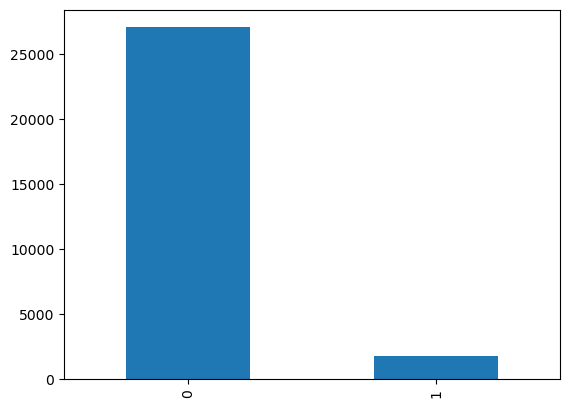

In [638]:
#  Checking balance of target wrt to target variable churn
churn.churn.value_counts().plot.bar()
plt.show()

In [639]:
# Clearly there is imbalance of data and hence it is necessary to handle the class imbalance

In [640]:
# Imporing SMOTE
from imblearn.over_sampling import SMOTE

In [879]:
# Instantiate SMOTE
sm = SMOTE(random_state=27)

In [880]:
# Fittign SMOTE to the train set
X_train_oversampled, y_train_oversampled = sm.fit_resample(X_train, y_train)

In [881]:
X_train = X_train_oversampled

In [882]:
y_train = y_train_oversampled

In [883]:
type(X_train)

pandas.core.frame.DataFrame

In [884]:
type(y_train)

pandas.core.series.Series

In [885]:
X_train.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,269.83,330.49,129.88,1484.16,1219.99,1059.63,37.530,22.83,28.06,663.66,334.06,362.46,12.14,5.14,18.33,0.00,0.00,0.0,713.34,362.04,408.86,0.00,0.88,0.00,1753.99,1549.06,1189.51,29.33,22.93,38.16,27.43,7.94,15.56,278.08,355.69,438.74,0.09,0.31,1.16,0.0,0.00,0.00,13.89,6.68,15.31,0.00,1.16,0.00,19.0,20.0,11.0,1778.0,1758.0,1284.0,128.0,130.0,144,110.0,130,130.0,0.00,0.000,0.00,0.00,0.00,0.0,419,0.00,0.00,0.00
1,27.59,57.31,34.18,373.59,479.93,752.21,15.480,13.19,16.63,205.04,164.63,281.71,2.88,0.00,0.46,0.00,0.00,0.0,223.41,177.83,298.81,0.00,0.00,0.04,401.19,537.24,786.41,5.31,8.73,1.69,10.44,7.76,4.18,107.91,90.04,146.18,0.10,1.98,0.45,0.0,0.00,0.00,12.36,4.16,0.51,0.06,1.28,0.00,2.0,6.0,2.0,0.0,1097.0,700.0,0.0,350.0,350,0.0,350,350.0,0.00,0.000,0.00,0.00,0.00,0.0,3651,0.00,0.00,0.00
2,260.66,205.34,198.03,907.03,981.74,377.91,55.380,49.03,41.48,121.61,147.11,73.81,4.33,0.53,2.88,0.00,11.53,0.0,181.33,196.68,118.18,0.00,34.18,0.00,1167.69,1167.44,557.76,64.93,39.89,40.23,0.31,0.00,0.50,174.61,207.19,123.96,12.24,9.76,28.93,0.0,6.59,0.00,24.78,22.88,93.94,1.38,4.15,2.56,8.0,12.0,6.0,827.0,1358.0,587.0,154.0,169.0,169,128.0,169,130.0,237.62,503.275,0.00,0.00,0.00,0.0,1327,0.00,0.00,0.00
3,604.83,293.69,128.19,755.26,934.41,823.76,525.655,293.69,128.19,581.24,751.34,761.64,0.00,2.83,0.00,5.15,0.00,0.0,1186.08,1047.88,889.84,6.53,3.46,0.88,1361.48,1231.58,952.84,7.38,35.81,20.24,5.11,3.31,10.83,285.46,263.51,283.03,0.00,0.28,0.00,0.0,0.00,2.71,63.66,27.84,119.94,1.46,0.13,0.00,17.0,15.0,13.0,710.0,660.0,633.0,48.0,110.0,149,44.0,44,149.0,0.00,0.000,0.00,0.00,0.00,0.0,2908,0.00,0.00,0.00
4,87.98,79.29,183.61,28.16,70.08,214.49,87.980,79.29,183.61,11.44,41.81,124.69,7.46,27.46,41.94,0.00,0.00,0.0,106.89,148.58,350.26,2.26,5.28,1.74,119.03,154.66,399.86,123.91,75.93,238.68,43.93,44.83,41.13,196.78,198.96,415.39,0.00,0.00,0.00,0.0,0.00,5.66,12.88,0.48,57.36,0.00,0.00,0.00,12.0,11.0,7.0,1204.0,1152.0,822.0,252.0,252.0,152,0.0,110,130.0,43.18,49.900,42.59,2129.05,448.61,704.8,2496,736.52,508.07,975.55


In [886]:
y_train.value_counts()

0    18937
1    18937
Name: churn, dtype: int64

In [887]:
# using Min Max scaler to scale the parameters
from sklearn.preprocessing import MinMaxScaler

In [888]:
scaler = MinMaxScaler()

In [889]:
cols = list(X_train.columns)

In [890]:
cols

['onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2f_mou_6',
 'loc_ic_t2f_mou_7',
 'loc_ic_t2f_mou_8',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'std_ic_t2t_mou_6',
 'std_ic_t2t_mou_7',
 'std_ic_t2t_mou_8',
 'std_ic_t2f_mou_6',
 'std_ic_t2f_mou_7',
 'std_ic_t2f_mou_8',
 'std_ic_mou_6',
 'std_ic_mou_7',
 'std_ic_mou_8',
 'ic_others_6',
 'ic_others_7',
 'ic_others_8',
 'total_rech_num_6',
 'total_rech_num_7',
 'total_rech_num_8',
 'total_rech_amt_6',
 'to

In [891]:
# Fitting the Min Max scaler
X_train[cols] = scaler.fit_transform(X_train[cols])

In [654]:
type(X_train)

pandas.core.frame.DataFrame

In [327]:
from sklearn.feature_selection import RFECV

In [525]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score, roc_curve, roc_auc_score

In [329]:
# Instantiate Logistic Regression
lreg = LogisticRegression()

In [330]:
# Using Cross Validation RFE to find optimal number of parameters
rfecv = RFECV(estimator=lreg, cv=4)

In [331]:
rfecv.fit(X_train, y_train)

RFECV(cv=4, estimator=LogisticRegression())

In [332]:
# Getting the current number of features
num_features = X_train.shape
num_features[1]

70

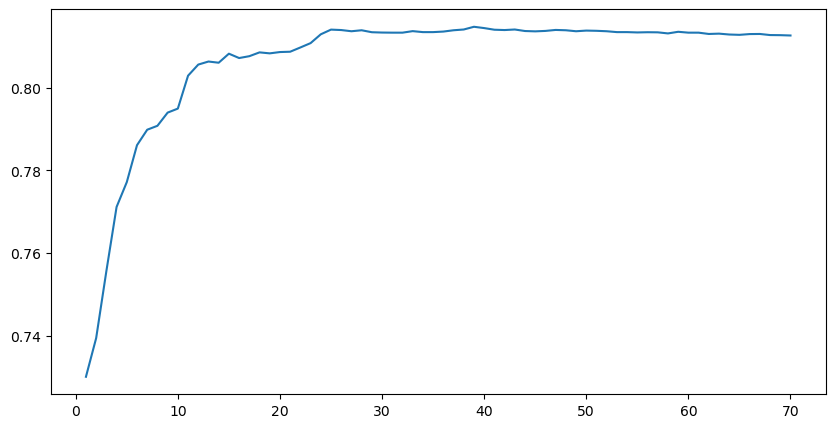

In [333]:
# plotting the curve of each of the fold with different parameters with mean test score
plt.figure(figsize=[10, 5])
plt.plot(range(1, num_features[1]+1), rfecv.cv_results_['mean_test_score'])
plt.show()

In [334]:
# Getting the recommended feature set
rfecv.n_features_

39

In [ ]:
# Though the feature set recommended is 39, according to the plot the accuracy flattens from 30 and to keep it simple limit it to 30

In [335]:
from sklearn.feature_selection import RFE

In [336]:
# Using RFE now with 30 parameters
rfe = RFE(estimator=lreg, n_features_to_select=30)

In [337]:
rfe.fit(X_train, y_train)

RFE(estimator=LogisticRegression(), n_features_to_select=30)

In [338]:
X_train.columns[rfe.support_]

Index(['onnet_mou_6', 'onnet_mou_7', 'offnet_mou_6', 'offnet_mou_7',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_mou_6', 'loc_og_mou_7',
       'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8',
       'loc_ic_t2f_mou_7', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8',
       'std_ic_mou_6', 'std_ic_mou_8', 'ic_others_8', 'total_rech_num_7',
       'total_rech_num_8', 'total_rech_amt_7', 'total_rech_amt_8',
       'last_day_rch_amt_8', 'vol_2g_mb_8', 'vol_3g_mb_7', 'vol_3g_mb_8',
       'aon'],
      dtype='object')

In [339]:
# Limiting the Train data to the selected 30 parameters
X_train_lg = X_train[X_train.columns[rfe.support_]]

In [340]:
# Fitting the simple Logistic Regression model
lreg.fit(X_train_lg, y_train)

LogisticRegression()

In [341]:
# Predict based on training set
y_train_pred = lreg.predict(X_train_lg)

In [342]:
# Importing libraries for model evaluation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [343]:
# accuracy based on the train data
accuracy_score(y_train, y_train_pred)

0.8141205048318108

In [344]:
confusion_matrix(y_train, y_train_pred)

array([[15020,  3917],
       [ 3123, 15814]], dtype=int64)

In [345]:
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       0.83      0.79      0.81     18937
           1       0.80      0.84      0.82     18937

    accuracy                           0.81     37874
   macro avg       0.81      0.81      0.81     37874
weighted avg       0.81      0.81      0.81     37874



In [346]:
from sklearn.model_selection import cross_val_score

In [347]:
# Checking the accuracy using cross valiadtion
cross_val_score(lreg, X_train_lg, y_train, n_jobs=-1)

array([0.80818482, 0.82389439, 0.81016502, 0.81320132, 0.81555321])

In [892]:
# Scaling the parameters using the scaler using earlier with only transform
X_test[cols] = scaler.transform(X_test[cols])

In [656]:
# Preparing to test the data
X_test_lg = X_test.copy()

In [657]:
# Limiting X test to parameters of the model
cols = list(X_test_lg.columns)

In [658]:
# Limiting X test to parameters of the model
X_test_lg = X_test_lg[X_test_lg.columns[rfe.support_]]

In [659]:
# Predicting y based on the test set
y_test_pred = lreg.predict(X_test_lg)

In [660]:
# accuracy score based on the test set.
accuracy_score(y_test, y_test_pred)

0.7895830927358818

In [661]:
# Accuracy with precision and recall values
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.98      0.79      0.88      8117
           1       0.20      0.79      0.32       542

    accuracy                           0.79      8659
   macro avg       0.59      0.79      0.60      8659
weighted avg       0.93      0.79      0.84      8659



In [355]:
from sklearn.ensemble import RandomForestClassifier

In [662]:
# trying the Random forest
rf = RandomForestClassifier(random_state=42, n_estimators=50, oob_score=True)

In [663]:
# Fitting random forest
rf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=50, oob_score=True, random_state=42)

In [893]:
# Predicting y based on the train set
y_train_pred = rf.predict(X_train)

In [894]:
# Accuracy of train data
accuracy_score(y_train, y_train_pred)

1.0

In [895]:
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     18937
           1       1.00      1.00      1.00     18937

    accuracy                           1.00     37874
   macro avg       1.00      1.00      1.00     37874
weighted avg       1.00      1.00      1.00     37874



In [666]:
# Predicting y based on the test set
y_test_pred = rf.predict(X_test)

In [667]:
accuracy_score(y_test, y_test_pred)

0.9285136851830466

In [668]:
# Metric for Random forests
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      8117
           1       0.43      0.42      0.43       542

    accuracy                           0.93      8659
   macro avg       0.69      0.69      0.69      8659
weighted avg       0.93      0.93      0.93      8659



In [669]:
from sklearn.tree import DecisionTreeClassifier

In [670]:
# Trying decision trees 
dt = DecisionTreeClassifier(random_state=42, max_depth=10)
dt.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=10, random_state=42)

In [896]:
#Predicting y based on the train set
y_train_pred = dt.predict(X_train)
accuracy_score(y_train, y_train_pred)

0.9118920631567831

In [897]:
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       0.93      0.89      0.91     18937
           1       0.89      0.94      0.91     18937

    accuracy                           0.91     37874
   macro avg       0.91      0.91      0.91     37874
weighted avg       0.91      0.91      0.91     37874



In [672]:
#Predicting y based on the train set
y_test_pred = dt.predict(X_test)

In [673]:
# Metric for Decision Trees initial
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.84      0.90      8117
           1       0.20      0.57      0.29       542

    accuracy                           0.83      8659
   macro avg       0.58      0.71      0.60      8659
weighted avg       0.92      0.83      0.86      8659



In [367]:
from sklearn.model_selection import GridSearchCV

In [368]:
# Initiating Random Forest for hyper parameter tuning
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [373]:
# Using Randomized cross validation since there is a lot of parameters
hyper_params = {'max_depth': range(3, 20),
                'max_features': range(10, 30),
                'min_samples_leaf': range(20, 400, 50),
                'n_estimators': range(10, 101, 10)}

In [375]:
from sklearn.model_selection import RandomizedSearchCV

In [376]:
# Initializing Randomized cross validation for hyper parameter tuning
model_rcv = RandomizedSearchCV(estimator=rf, 
                              param_distributions=hyper_params,
                              verbose=1,
                              cv=5,
                              return_train_score=True,
                              n_jobs=-1,
                              n_iter=50)

In [377]:
# Fitting the model
model_rcv.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': range(3, 20),
                                        'max_features': range(10, 30),
                                        'min_samples_leaf': range(20, 400, 50),
                                        'n_estimators': range(10, 101, 10)},
                   return_train_score=True, verbose=1)

In [601]:
# Getting the best score for accuracy
model_rcv.best_score_

0.9205525730286259

In [602]:
# Getting the best model for random forests
rf_best = model_rcv.best_estimator_

In [898]:
y_train_pred = rf_best.predict(X_train)

In [899]:
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95     18937
           1       0.95      0.96      0.95     18937

    accuracy                           0.95     37874
   macro avg       0.95      0.95      0.95     37874
weighted avg       0.95      0.95      0.95     37874



In [674]:
# Predicting based on test set
y_test_pred = rf_best.predict(X_test)

In [675]:
# Metrics of Best 1 Random Forests 
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.92      0.95      8117
           1       0.34      0.61      0.44       542

    accuracy                           0.90      8659
   macro avg       0.66      0.76      0.69      8659
weighted avg       0.93      0.90      0.91      8659



In [383]:
# Listing the parameters for the Best Model for random forest
rf_best

RandomForestClassifier(max_depth=14, max_features=17, min_samples_leaf=20,
                       n_estimators=90, n_jobs=-1, random_state=42)

In [384]:
# Trying one more round of random CV
hyper_params_2 = {'max_depth': range(15, 25),
                'max_features': range(15, 25),
                'min_samples_leaf': range(20, 200, 50),
                'n_estimators': range(40, 101, 10)}

In [385]:
# Initializing Random CV
model_rcv2 = RandomizedSearchCV(estimator=rf, 
                              param_distributions=hyper_params_2,
                              verbose=1,
                              cv=5,
                              return_train_score=True,
                              n_jobs=-1,
                              n_iter=50)

In [566]:
# Fitting random CV
model_rcv2.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': range(15, 25),
                                        'max_features': range(15, 25),
                                        'min_samples_leaf': range(20, 200, 50),
                                        'n_estimators': range(40, 101, 10)},
                   return_train_score=True, verbose=1)

In [567]:
# accuracy has increased a bit 
model_rcv2.best_score_

0.9229817414273775

In [568]:
# Random forest Best 2 
rf_best2 = model_rcv.best_estimator_

In [900]:
y_train_pred = rf_best2.predict(X_train)

In [901]:
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95     18937
           1       0.95      0.96      0.95     18937

    accuracy                           0.95     37874
   macro avg       0.95      0.95      0.95     37874
weighted avg       0.95      0.95      0.95     37874



In [676]:
# predicting based on test data
y_test_pred = rf_best2.predict(X_test)

In [677]:
accuracy_score(y_test, y_test_pred)

0.9016052661970204

In [678]:
# Metrics for Best 2 random forest model
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.92      0.95      8117
           1       0.34      0.61      0.44       542

    accuracy                           0.90      8659
   macro avg       0.66      0.76      0.69      8659
weighted avg       0.93      0.90      0.91      8659



In [387]:
# Initialising Decision Trees for hyper parameter tuning 
dt = DecisionTreeClassifier(random_state=42)

In [388]:
# Setting the hyperparameters for grid search 
params = {
    "max_depth": [2, 3, 5, 10, 20, 30, 40, 50, 100],
    "min_samples_leaf": [5, 10, 20, 50, 100, 250, 500, 800, 1000],
}

In [389]:
# Initializing the grid search
dtcv =                     GridSearchCV(estimator=dt,
                           param_grid=params,
                           cv=4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

In [390]:
# Fitting Grid search CV
dtcv.fit(X_train, y_train)

Fitting 4 folds for each of 81 candidates, totalling 324 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20, 30, 40, 50, 100],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 250, 500, 800,
                                              1000]},
             scoring='accuracy', verbose=1)

In [904]:
# Best score for Decision trees
dtcv.best_score_

0.8874167240103041

In [398]:
# Getting the best decision tree estimator
dt_best = dtcv.best_estimator_

In [399]:
# Listing the parameters for the best model
dt_best

DecisionTreeClassifier(max_depth=20, min_samples_leaf=5, random_state=42)

In [902]:
y_train_pred = dt_best.predict(X_train)

In [903]:
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       0.97      0.96      0.96     18937
           1       0.96      0.97      0.96     18937

    accuracy                           0.96     37874
   macro avg       0.96      0.96      0.96     37874
weighted avg       0.96      0.96      0.96     37874



In [679]:
# Predicting based on test data on best decision tree model
y_test_pred = dt_best.predict(X_test)

In [680]:
# Metrics based on decisopm tree model
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.96      0.88      0.92      8117
           1       0.20      0.45      0.27       542

    accuracy                           0.85      8659
   macro avg       0.58      0.66      0.60      8659
weighted avg       0.91      0.85      0.88      8659



In [682]:
# Importing stats model to create a Logistics Regresson model and fine tune the parameters based on significance and vif scores
import statsmodels.api as sm

In [721]:
# Starting the model with the parameters selected by RFE
col = X_train.columns[rfe.support_]

In [722]:
len(col)

30

In [723]:
# Adding constant for GLM model
X_train_sm = sm.add_constant(X_train[col])

In [724]:
# Initializing the Logistic regression using GLM
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())

In [725]:
# Fitting the model
res = logm2.fit()

In [726]:
# Summary of the Model 
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37843
Model Family:                Binomial   Df Model:                           30
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16209.
Date:                Sun, 09 Jul 2023   Deviance:                       32418.
Time:                        16:34:20   Pearson chi2:                 6.52e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4116
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.9725      0.041     23.686      0.000       0.892       1.053
onnet_mou_6            1.8339      0.237      7.732      0.000       1.369       2.299
onnet_mou_7            1.5663      0.274      5.718      0.000       1.029       2.103
offnet_mou_6           1.3864      0.258      5.380      0.000       0.881       1.891
offnet_mou_7           2.2924      0.299      7.665      0.000       1.706       2.879
loc_og_t2t_mou_7      -0.9064      0.219     -4.143      0.000      -1.335      -0.478
loc_og_t2t_mou_8      -1.8154      0.215     -8.453      0.000      -2.236      -1.394
loc_og_t2m_mou_6      -2.7741      0.294     -9.438      0.000      -3.350      -2.198
loc_og_t2m_mou_7      -1.1506      0.377     -3.054      0.002      -1.889      -0.412
loc_og_t2m_mou_8      -1.4133      0.251     -5.630      0.000      -1.905      -0.921
loc_og_mou_6           1.3991      0.284      4.932      0.000       0.843       1.955
loc_og_mou_7           1.4182      0.423      3.349      0.001       0.588       2.248
total_og_mou_6        -1.5402      0.363     -4.238      0.000      -2.253      -0.828
total_og_mou_7        -1.0879      0.415     -2.623      0.009      -1.901      -0.275
total_og_mou_8        -4.5628      0.195    -23.357      0.000      -4.946      -4.180
loc_ic_t2f_mou_7      -1.3056      0.111    -11.785      0.000      -1.523      -1.089
loc_ic_mou_6           1.7406      0.210      8.298      0.000       1.329       2.152
loc_ic_mou_7           2.9782      0.268     11.101      0.000       2.452       3.504
loc_ic_mou_8          -7.4012      0.295    -25.108      0.000      -7.979      -6.823
std_ic_mou_6           1.0029      0.097     10.297      0.000       0.812       1.194
std_ic_mou_8          -1.9976      0.113    -17.656      0.000      -2.219      -1.776
ic_others_8           -0.6898      0.075     -9.236      0.000      -0.836      -0.543
total_rech_num_7       1.9640      0.154     12.713      0.000       1.661       2.267
total_rech_num_8      -3.7034      0.185    -20.055      0.000      -4.065      -3.341
total_rech_amt_7       0.9456      0.164      5.760      0.000       0.624       1.267
total_rech_amt_8       2.5439      0.203     12.507      0.000       2.145       2.943
last_day_rch_amt_8    -3.2902      0.129    -25.482      0.000      -3.543      -3.037
vol_2g_mb_8           -1.7488      0.082    -21.307      0.000      -1.910      -1.588
vol_3g_mb_7            1.1536      0.115      9.989      0.000       0.927       1.380
vol_3g_mb_8           -3.6306      0.156    -23.249      0.000      -3.937      -3.325
aon                   -1.0496      0.072    -14.510      0.000      -1.191      -0.908
======================================================================================
"""

In [727]:
# Predicting using the train set
y_train_pred = res.predict(X_train_sm)

In [728]:
y_train_pred = y_train_pred.values.reshape(-1)

In [729]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})

In [730]:
# Predicting using the probability threshold as 0.5
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

In [731]:
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.213781,0
1,0,0.064320,0
2,0,0.443856,0
3,0,0.022756,0
4,0,0.017573,0


In [732]:
# Accuracy of train data 
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8150446216401753


In [733]:
# Importing library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [734]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,total_og_mou_7,52.07
11,total_og_mou_6,44.80
10,loc_og_mou_7,33.35
3,offnet_mou_7,28.72
7,loc_og_t2m_mou_7,25.52
2,offnet_mou_6,22.54
1,onnet_mou_7,21.04
0,onnet_mou_6,17.96
9,loc_og_mou_6,17.34
6,loc_og_t2m_mou_6,16.22


In [735]:
# Dropping the below variable due to high VIF
col = col.drop('total_og_mou_7', 1)

In [736]:
# Fitting the model again after dropping the above parameter
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37844
Model Family:                Binomial   Df Model:                           29
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16213.
Date:                Sun, 09 Jul 2023   Deviance:                       32425.
Time:                        16:34:37   Pearson chi2:                 6.51e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4115
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.9804      0.041     23.944      0.000       0.900       1.061
onnet_mou_6            2.1169      0.211     10.020      0.000       1.703       2.531
onnet_mou_7            0.9532      0.142      6.719      0.000       0.675       1.231
offnet_mou_6           1.6953      0.229      7.404      0.000       1.247       2.144
offnet_mou_7           1.6175      0.151     10.745      0.000       1.322       1.913
loc_og_t2t_mou_7      -0.9004      0.219     -4.117      0.000      -1.329      -0.472
loc_og_t2t_mou_8      -1.8149      0.215     -8.450      0.000      -2.236      -1.394
loc_og_t2m_mou_6      -2.8138      0.293     -9.590      0.000      -3.389      -2.239
loc_og_t2m_mou_7      -1.1364      0.377     -3.017      0.003      -1.875      -0.398
loc_og_t2m_mou_8      -1.3988      0.251     -5.566      0.000      -1.891      -0.906
loc_og_mou_6           1.4655      0.282      5.197      0.000       0.913       2.018
loc_og_mou_7           1.3567      0.422      3.212      0.001       0.529       2.185
total_og_mou_6        -2.0244      0.312     -6.480      0.000      -2.637      -1.412
total_og_mou_8        -4.7112      0.188    -25.122      0.000      -5.079      -4.344
loc_ic_t2f_mou_7      -1.3160      0.111    -11.877      0.000      -1.533      -1.099
loc_ic_mou_6           1.7528      0.210      8.364      0.000       1.342       2.164
loc_ic_mou_7           2.9381      0.268     10.976      0.000       2.413       3.463
loc_ic_mou_8          -7.3912      0.295    -25.075      0.000      -7.969      -6.813
std_ic_mou_6           1.0028      0.097     10.298      0.000       0.812       1.194
std_ic_mou_8          -1.9961      0.113    -17.645      0.000      -2.218      -1.774
ic_others_8           -0.6935      0.075     -9.282      0.000      -0.840      -0.547
total_rech_num_7       1.9281      0.154     12.533      0.000       1.627       2.230
total_rech_num_8      -3.6712      0.184    -19.936      0.000      -4.032      -3.310
total_rech_amt_7       0.9545      0.164      5.810      0.000       0.633       1.276
total_rech_amt_8       2.6252      0.201     13.060      0.000       2.231       3.019
last_day_rch_amt_8    -3.2844      0.129    -25.450      0.000      -3.537      -3.031
vol_2g_mb_8           -1.7577      0.082    -21.457      0.000      -1.918      -1.597
vol_3g_mb_7            1.1449      0.116      9.912      0.000       0.919       1.371
vol_3g_mb_8           -3.6438      0.156    -23.330      0.000      -3.950      -3.338
aon                   -1.0506      0.072    -14.529      0.000      -1.192      -0.909
======================================================================================
"""

In [737]:
# Predicting using the train set
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [738]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [739]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.214311,0
1,0,0.064449,0
2,0,0.443700,0
3,0,0.022913,0
4,0,0.017739,0


In [740]:
# Let's check the overall accuracy.
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8157047050747215


In [741]:
# Calculating VIF scores 
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,loc_og_mou_7,33.13
11,total_og_mou_6,30.86
7,loc_og_t2m_mou_7,25.49
9,loc_og_mou_6,17.26
2,offnet_mou_6,16.49
6,loc_og_t2m_mou_6,16.19
0,onnet_mou_6,13.44
15,loc_ic_mou_7,11.99
22,total_rech_amt_7,11.59
23,total_rech_amt_8,10.06


In [742]:
# Dropping the below variable due to high VIF
col = col.drop('loc_og_mou_7')
col

Index(['onnet_mou_6', 'onnet_mou_7', 'offnet_mou_6', 'offnet_mou_7',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_mou_6',
       'total_og_mou_6', 'total_og_mou_8', 'loc_ic_t2f_mou_7', 'loc_ic_mou_6',
       'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_8',
       'ic_others_8', 'total_rech_num_7', 'total_rech_num_8',
       'total_rech_amt_7', 'total_rech_amt_8', 'last_day_rch_amt_8',
       'vol_2g_mb_8', 'vol_3g_mb_7', 'vol_3g_mb_8', 'aon'],
      dtype='object')

In [743]:
# Fitting the model again after dropping the above parameter
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37845
Model Family:                Binomial   Df Model:                           28
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16218.
Date:                Sun, 09 Jul 2023   Deviance:                       32435.
Time:                        16:34:50   Pearson chi2:                 6.44e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4113
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.9650      0.041     23.744      0.000       0.885       1.045
onnet_mou_6            2.0939      0.211      9.903      0.000       1.679       2.508
onnet_mou_7            1.0399      0.140      7.452      0.000       0.766       1.313
offnet_mou_6           1.7343      0.229      7.568      0.000       1.285       2.183
offnet_mou_7           1.6352      0.151     10.860      0.000       1.340       1.930
loc_og_t2t_mou_7      -0.5370      0.188     -2.858      0.004      -0.905      -0.169
loc_og_t2t_mou_8      -1.6636      0.208     -7.985      0.000      -2.072      -1.255
loc_og_t2m_mou_6      -3.1140      0.280    -11.105      0.000      -3.664      -2.564
loc_og_t2m_mou_7      -0.1966      0.237     -0.828      0.408      -0.662       0.269
loc_og_t2m_mou_8      -1.4102      0.252     -5.596      0.000      -1.904      -0.916
loc_og_mou_6           1.8874      0.254      7.437      0.000       1.390       2.385
total_og_mou_6        -2.0721      0.313     -6.622      0.000      -2.685      -1.459
total_og_mou_8        -4.7372      0.188    -25.223      0.000      -5.105      -4.369
loc_ic_t2f_mou_7      -1.2919      0.111    -11.680      0.000      -1.509      -1.075
loc_ic_mou_6           1.7328      0.210      8.236      0.000       1.320       2.145
loc_ic_mou_7           2.9371      0.268     10.939      0.000       2.411       3.463
loc_ic_mou_8          -7.4427      0.296    -25.184      0.000      -8.022      -6.863
std_ic_mou_6           1.0029      0.097     10.302      0.000       0.812       1.194
std_ic_mou_8          -1.9948      0.113    -17.634      0.000      -2.217      -1.773
ic_others_8           -0.6958      0.075     -9.315      0.000      -0.842      -0.549
total_rech_num_7       1.9382      0.154     12.591      0.000       1.636       2.240
total_rech_num_8      -3.6556      0.184    -19.856      0.000      -4.016      -3.295
total_rech_amt_7       0.9557      0.164      5.816      0.000       0.634       1.278
total_rech_amt_8       2.5946      0.201     12.933      0.000       2.201       2.988
last_day_rch_amt_8    -3.2711      0.129    -25.362      0.000      -3.524      -3.018
vol_2g_mb_8           -1.7469      0.082    -21.358      0.000      -1.907      -1.587
vol_3g_mb_7            1.1559      0.115     10.011      0.000       0.930       1.382
vol_3g_mb_8           -3.6466      0.156    -23.344      0.000      -3.953      -3.340
aon                   -1.0521      0.072    -14.554      0.000      -1.194      -0.910
======================================================================================
"""

In [744]:
# Predicting using the train set
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [745]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [746]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.211302,0
1,0,0.063682,0
2,0,0.445546,0
3,0,0.025912,0
4,0,0.018104,0


In [747]:
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8155990917251941


In [748]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,total_og_mou_6,30.84
2,offnet_mou_6,16.48
6,loc_og_t2m_mou_6,14.11
0,onnet_mou_6,13.32
9,loc_og_mou_6,12.72
14,loc_ic_mou_7,11.99
21,total_rech_amt_7,11.59
7,loc_og_t2m_mou_7,10.08
22,total_rech_amt_8,10.05
19,total_rech_num_7,8.24


In [749]:
col = col.drop('total_og_mou_6')

In [750]:
X_train_sm = sm.add_constant(X_train[col])
logm5 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm5.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37846
Model Family:                Binomial   Df Model:                           27
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16240.
Date:                Sun, 09 Jul 2023   Deviance:                       32480.
Time:                        16:34:58   Pearson chi2:                 6.49e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4106
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.0039      0.040     24.971      0.000       0.925       1.083
onnet_mou_6            0.8960      0.108      8.297      0.000       0.684       1.108
onnet_mou_7            1.0599      0.140      7.559      0.000       0.785       1.335
offnet_mou_6           0.4103      0.109      3.768      0.000       0.197       0.624
offnet_mou_7           1.6548      0.151     10.928      0.000       1.358       1.952
loc_og_t2t_mou_7      -0.5241      0.188     -2.792      0.005      -0.892      -0.156
loc_og_t2t_mou_8      -1.5653      0.208     -7.523      0.000      -1.973      -1.157
loc_og_t2m_mou_6      -2.9513      0.280    -10.534      0.000      -3.500      -2.402
loc_og_t2m_mou_7      -0.2511      0.237     -1.059      0.289      -0.716       0.214
loc_og_t2m_mou_8      -1.3459      0.252     -5.345      0.000      -1.839      -0.852
loc_og_mou_6           1.6526      0.254      6.518      0.000       1.156       2.150
total_og_mou_8        -5.0023      0.184    -27.135      0.000      -5.364      -4.641
loc_ic_t2f_mou_7      -1.2974      0.110    -11.743      0.000      -1.514      -1.081
loc_ic_mou_6           1.6620      0.211      7.891      0.000       1.249       2.075
loc_ic_mou_7           2.9808      0.269     11.075      0.000       2.453       3.508
loc_ic_mou_8          -7.5213      0.297    -25.363      0.000      -8.103      -6.940
std_ic_mou_6           0.9663      0.097      9.948      0.000       0.776       1.157
std_ic_mou_8          -1.9589      0.113    -17.353      0.000      -2.180      -1.738
ic_others_8           -0.6943      0.075     -9.293      0.000      -0.841      -0.548
total_rech_num_7       1.8412      0.153     12.011      0.000       1.541       2.142
total_rech_num_8      -3.6212      0.184    -19.675      0.000      -3.982      -3.260
total_rech_amt_7       1.0099      0.164      6.144      0.000       0.688       1.332
total_rech_amt_8       2.7502      0.199     13.840      0.000       2.361       3.140
last_day_rch_amt_8    -3.2509      0.128    -25.326      0.000      -3.503      -2.999
vol_2g_mb_8           -1.7664      0.082    -21.640      0.000      -1.926      -1.606
vol_3g_mb_7            1.1148      0.115      9.665      0.000       0.889       1.341
vol_3g_mb_8           -3.6753      0.156    -23.517      0.000      -3.982      -3.369
aon                   -1.0378      0.072    -14.407      0.000      -1.179      -0.897
======================================================================================
"""

In [751]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [752]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [753]:
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8155990917251941


In [754]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,loc_og_t2m_mou_6,14.08
9,loc_og_mou_6,12.56
13,loc_ic_mou_7,11.98
20,total_rech_amt_7,11.53
7,loc_og_t2m_mou_7,10.08
21,total_rech_amt_8,9.88
18,total_rech_num_7,8.22
12,loc_ic_mou_6,8.07
3,offnet_mou_7,7.82
19,total_rech_num_8,7.79


In [755]:
col = col.drop('loc_og_t2m_mou_7')

In [756]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm6 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm6.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37847
Model Family:                Binomial   Df Model:                           26
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16241.
Date:                Sun, 09 Jul 2023   Deviance:                       32481.
Time:                        16:35:05   Pearson chi2:                 6.53e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4106
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.0039      0.040     24.975      0.000       0.925       1.083
onnet_mou_6            0.8954      0.108      8.294      0.000       0.684       1.107
onnet_mou_7            1.0513      0.140      7.514      0.000       0.777       1.326
offnet_mou_6           0.4367      0.106      4.116      0.000       0.229       0.645
offnet_mou_7           1.6086      0.145     11.105      0.000       1.325       1.892
loc_og_t2t_mou_7      -0.5383      0.187     -2.874      0.004      -0.905      -0.171
loc_og_t2t_mou_8      -1.5617      0.208     -7.506      0.000      -1.969      -1.154
loc_og_t2m_mou_6      -3.0849      0.250    -12.319      0.000      -3.576      -2.594
loc_og_t2m_mou_8      -1.4877      0.214     -6.956      0.000      -1.907      -1.069
loc_og_mou_6           1.6710      0.253      6.606      0.000       1.175       2.167
total_og_mou_8        -4.9814      0.183    -27.206      0.000      -5.340      -4.623
loc_ic_t2f_mou_7      -1.2959      0.110    -11.729      0.000      -1.512      -1.079
loc_ic_mou_6           1.7096      0.206      8.306      0.000       1.306       2.113
loc_ic_mou_7           2.8811      0.252     11.433      0.000       2.387       3.375
loc_ic_mou_8          -7.4684      0.292    -25.567      0.000      -8.041      -6.896
std_ic_mou_6           0.9676      0.097      9.963      0.000       0.777       1.158
std_ic_mou_8          -1.9586      0.113    -17.352      0.000      -2.180      -1.737
ic_others_8           -0.6957      0.075     -9.309      0.000      -0.842      -0.549
total_rech_num_7       1.8396      0.153     12.000      0.000       1.539       2.140
total_rech_num_8      -3.6199      0.184    -19.664      0.000      -3.981      -3.259
total_rech_amt_7       1.0020      0.164      6.102      0.000       0.680       1.324
total_rech_amt_8       2.7699      0.198     13.996      0.000       2.382       3.158
last_day_rch_amt_8    -3.2535      0.128    -25.349      0.000      -3.505      -3.002
vol_2g_mb_8           -1.7673      0.082    -21.653      0.000      -1.927      -1.607
vol_3g_mb_7            1.1171      0.115      9.684      0.000       0.891       1.343
vol_3g_mb_8           -3.6793      0.156    -23.545      0.000      -3.986      -3.373
aon                   -1.0386      0.072    -14.418      0.000      -1.180      -0.897
======================================================================================
"""

In [757]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [758]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [759]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

In [760]:
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8154934783756667


In [761]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,loc_og_mou_6,12.54
19,total_rech_amt_7,11.50
6,loc_og_t2m_mou_6,11.26
12,loc_ic_mou_7,10.59
20,total_rech_amt_8,9.84
17,total_rech_num_7,8.22
18,total_rech_num_8,7.79
11,loc_ic_mou_6,7.74
13,loc_ic_mou_8,7.16
3,offnet_mou_7,7.16


In [762]:
col = col.drop('loc_og_mou_6', 1)

In [763]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm7 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm7.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37848
Model Family:                Binomial   Df Model:                           25
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16263.
Date:                Sun, 09 Jul 2023   Deviance:                       32527.
Time:                        16:35:11   Pearson chi2:                 6.46e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4099
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.9852      0.040     24.563      0.000       0.907       1.064
onnet_mou_6            1.1602      0.101     11.461      0.000       0.962       1.359
onnet_mou_7            0.8885      0.138      6.459      0.000       0.619       1.158
offnet_mou_6           0.4623      0.106      4.363      0.000       0.255       0.670
offnet_mou_7           1.6138      0.145     11.147      0.000       1.330       1.898
loc_og_t2t_mou_7       0.0006      0.166      0.003      0.997      -0.326       0.327
loc_og_t2t_mou_8      -1.3371      0.200     -6.683      0.000      -1.729      -0.945
loc_og_t2m_mou_6      -1.8324      0.163    -11.237      0.000      -2.152      -1.513
loc_og_t2m_mou_8      -1.6449      0.214     -7.698      0.000      -2.064      -1.226
total_og_mou_8        -5.0317      0.183    -27.446      0.000      -5.391      -4.672
loc_ic_t2f_mou_7      -1.2771      0.110    -11.603      0.000      -1.493      -1.061
loc_ic_mou_6           1.8065      0.203      8.909      0.000       1.409       2.204
loc_ic_mou_7           2.6591      0.247     10.769      0.000       2.175       3.143
loc_ic_mou_8          -7.2836      0.287    -25.339      0.000      -7.847      -6.720
std_ic_mou_6           0.9380      0.097      9.684      0.000       0.748       1.128
std_ic_mou_8          -1.9384      0.113    -17.200      0.000      -2.159      -1.718
ic_others_8           -0.6995      0.075     -9.378      0.000      -0.846      -0.553
total_rech_num_7       1.8531      0.153     12.095      0.000       1.553       2.153
total_rech_num_8      -3.6205      0.184    -19.677      0.000      -3.981      -3.260
total_rech_amt_7       0.9883      0.164      6.032      0.000       0.667       1.309
total_rech_amt_8       2.7505      0.198     13.926      0.000       2.363       3.138
last_day_rch_amt_8    -3.2219      0.128    -25.173      0.000      -3.473      -2.971
vol_2g_mb_8           -1.7624      0.082    -21.599      0.000      -1.922      -1.602
vol_3g_mb_7            1.1554      0.115     10.056      0.000       0.930       1.381
vol_3g_mb_8           -3.6935      0.156    -23.655      0.000      -4.000      -3.387
aon                   -1.0519      0.072    -14.632      0.000      -1.193      -0.911
======================================================================================
"""

In [764]:
col = col.drop('loc_og_t2t_mou_7', 1)

In [765]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm8 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm8.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37849
Model Family:                Binomial   Df Model:                           24
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16263.
Date:                Sun, 09 Jul 2023   Deviance:                       32527.
Time:                        16:35:12   Pearson chi2:                 6.46e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4099
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.9852      0.040     24.563      0.000       0.907       1.064
onnet_mou_6            1.1602      0.101     11.479      0.000       0.962       1.358
onnet_mou_7            0.8886      0.136      6.523      0.000       0.622       1.156
offnet_mou_6           0.4623      0.106      4.366      0.000       0.255       0.670
offnet_mou_7           1.6139      0.144     11.230      0.000       1.332       1.896
loc_og_t2t_mou_8      -1.3366      0.123    -10.875      0.000      -1.577      -1.096
loc_og_t2m_mou_6      -1.8323      0.162    -11.320      0.000      -2.150      -1.515
loc_og_t2m_mou_8      -1.6449      0.213     -7.714      0.000      -2.063      -1.227
total_og_mou_8        -5.0318      0.181    -27.767      0.000      -5.387      -4.677
loc_ic_t2f_mou_7      -1.2771      0.110    -11.608      0.000      -1.493      -1.061
loc_ic_mou_6           1.8064      0.203      8.911      0.000       1.409       2.204
loc_ic_mou_7           2.6592      0.241     11.027      0.000       2.187       3.132
loc_ic_mou_8          -7.2837      0.286    -25.483      0.000      -7.844      -6.724
std_ic_mou_6           0.9380      0.097      9.695      0.000       0.748       1.128
std_ic_mou_8          -1.9384      0.113    -17.201      0.000      -2.159      -1.718
ic_others_8           -0.6995      0.075     -9.378      0.000      -0.846      -0.553
total_rech_num_7       1.8531      0.153     12.097      0.000       1.553       2.153
total_rech_num_8      -3.6205      0.184    -19.682      0.000      -3.981      -3.260
total_rech_amt_7       0.9883      0.164      6.032      0.000       0.667       1.309
total_rech_amt_8       2.7505      0.197     13.931      0.000       2.364       3.137
last_day_rch_amt_8    -3.2219      0.128    -25.173      0.000      -3.473      -2.971
vol_2g_mb_8           -1.7624      0.082    -21.602      0.000      -1.922      -1.602
vol_3g_mb_7            1.1554      0.115     10.057      0.000       0.930       1.381
vol_3g_mb_8           -3.6935      0.156    -23.655      0.000      -4.000      -3.387
aon                   -1.0519      0.072    -14.634      0.000      -1.193      -0.911
======================================================================================
"""

In [766]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [767]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [768]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.212601,0
1,0,0.064341,0
2,0,0.459983,0
3,0,0.019695,0
4,0,0.020777,0


In [769]:
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8144373448803929


In [770]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
17,total_rech_amt_7,11.49
10,loc_ic_mou_7,9.96
18,total_rech_amt_8,9.83
15,total_rech_num_7,8.22
16,total_rech_num_8,7.79
9,loc_ic_mou_6,7.66
3,offnet_mou_7,7.08
11,loc_ic_mou_8,7.00
7,total_og_mou_8,6.30
1,onnet_mou_7,5.77


In [771]:
col = col.drop('total_rech_amt_7', 1)

In [772]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm9 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm9.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37850
Model Family:                Binomial   Df Model:                           23
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16282.
Date:                Sun, 09 Jul 2023   Deviance:                       32564.
Time:                        16:35:20   Pearson chi2:                 6.56e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4093
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.0341      0.039     26.305      0.000       0.957       1.111
onnet_mou_6            1.1284      0.101     11.167      0.000       0.930       1.326
onnet_mou_7            1.1910      0.127      9.384      0.000       0.942       1.440
offnet_mou_6           0.4260      0.106      4.032      0.000       0.219       0.633
offnet_mou_7           1.9852      0.130     15.256      0.000       1.730       2.240
loc_og_t2t_mou_8      -1.3312      0.123    -10.851      0.000      -1.572      -1.091
loc_og_t2m_mou_6      -1.8095      0.161    -11.211      0.000      -2.126      -1.493
loc_og_t2m_mou_8      -1.5730      0.212     -7.415      0.000      -1.989      -1.157
total_og_mou_8        -5.2632      0.177    -29.687      0.000      -5.611      -4.916
loc_ic_t2f_mou_7      -1.2478      0.110    -11.386      0.000      -1.463      -1.033
loc_ic_mou_6           1.7662      0.202      8.738      0.000       1.370       2.162
loc_ic_mou_7           2.7172      0.241     11.296      0.000       2.246       3.189
loc_ic_mou_8          -7.3226      0.286    -25.587      0.000      -7.883      -6.762
std_ic_mou_6           0.9467      0.097      9.795      0.000       0.757       1.136
std_ic_mou_8          -1.9336      0.113    -17.148      0.000      -2.155      -1.713
ic_others_8           -0.6935      0.075     -9.307      0.000      -0.839      -0.547
total_rech_num_7       2.1752      0.145     15.033      0.000       1.892       2.459
total_rech_num_8      -3.9450      0.177    -22.260      0.000      -4.292      -3.598
total_rech_amt_8       3.3274      0.173     19.187      0.000       2.987       3.667
last_day_rch_amt_8    -3.2540      0.128    -25.448      0.000      -3.505      -3.003
vol_2g_mb_8           -1.7479      0.081    -21.457      0.000      -1.908      -1.588
vol_3g_mb_7            1.3122      0.112     11.721      0.000       1.093       1.532
vol_3g_mb_8           -3.7433      0.156    -23.986      0.000      -4.049      -3.437
aon                   -1.0396      0.072    -14.481      0.000      -1.180      -0.899
======================================================================================
"""

In [773]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [774]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [775]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

In [776]:
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8139356814701378


In [777]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,loc_ic_mou_7,9.94
9,loc_ic_mou_6,7.66
17,total_rech_amt_8,7.49
16,total_rech_num_8,7.29
11,loc_ic_mou_8,7.00
15,total_rech_num_7,6.98
7,total_og_mou_8,5.89
3,offnet_mou_7,5.58
1,onnet_mou_7,4.96
6,loc_og_t2m_mou_8,4.81


In [778]:
col = col.drop('loc_ic_mou_7', 1)

In [779]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()
y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred_final['Churn_Prob'] = y_train_pred
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8139356814701378


In [780]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37851
Model Family:                Binomial   Df Model:                           22
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16347.
Date:                Sun, 09 Jul 2023   Deviance:                       32695.
Time:                        16:35:27   Pearson chi2:                 6.56e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4073
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.0420      0.039     26.530      0.000       0.965       1.119
onnet_mou_6            1.0296      0.101     10.209      0.000       0.832       1.227
onnet_mou_7            1.4043      0.126     11.124      0.000       1.157       1.652
offnet_mou_6           0.2433      0.104      2.331      0.020       0.039       0.448
offnet_mou_7           2.3566      0.127     18.585      0.000       2.108       2.605
loc_og_t2t_mou_8      -1.3254      0.122    -10.892      0.000      -1.564      -1.087
loc_og_t2m_mou_6      -1.7259      0.159    -10.883      0.000      -2.037      -1.415
loc_og_t2m_mou_8      -1.5793      0.210     -7.515      0.000      -1.991      -1.167
total_og_mou_8        -5.5215      0.177    -31.146      0.000      -5.869      -5.174
loc_ic_t2f_mou_7      -0.9552      0.104     -9.188      0.000      -1.159      -0.751
loc_ic_mou_6           2.9256      0.172     17.005      0.000       2.588       3.263
loc_ic_mou_8          -5.7757      0.242    -23.833      0.000      -6.251      -5.301
std_ic_mou_6           0.9634      0.096     10.000      0.000       0.775       1.152
std_ic_mou_8          -1.9567      0.113    -17.354      0.000      -2.178      -1.736
ic_others_8           -0.6744      0.074     -9.108      0.000      -0.819      -0.529
total_rech_num_7       2.3054      0.145     15.928      0.000       2.022       2.589
total_rech_num_8      -4.0870      0.178    -23.021      0.000      -4.435      -3.739
total_rech_amt_8       3.3134      0.173     19.116      0.000       2.974       3.653
last_day_rch_amt_8    -3.3175      0.128    -26.009      0.000      -3.567      -3.067
vol_2g_mb_8           -1.7518      0.081    -21.537      0.000      -1.911      -1.592
vol_3g_mb_7            1.3479      0.112     12.014      0.000       1.128       1.568
vol_3g_mb_8           -3.7881      0.156    -24.214      0.000      -4.095      -3.481
aon                   -1.0500      0.071    -14.692      0.000      -1.190      -0.910
======================================================================================
"""

In [781]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
16,total_rech_amt_8,7.49
15,total_rech_num_8,7.26
14,total_rech_num_7,6.92
7,total_og_mou_8,5.85
3,offnet_mou_7,5.29
10,loc_ic_mou_8,5.27
9,loc_ic_mou_6,5.25
1,onnet_mou_7,4.89
6,loc_og_t2m_mou_8,4.81
5,loc_og_t2m_mou_6,4.80


In [782]:
col = col.drop('total_rech_amt_8', 1)
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()

In [783]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37852
Model Family:                Binomial   Df Model:                           21
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16542.
Date:                Sun, 09 Jul 2023   Deviance:                       33084.
Time:                        16:35:31   Pearson chi2:                 5.84e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4012
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.0410      0.039     26.674      0.000       0.965       1.117
onnet_mou_6            0.9866      0.101      9.774      0.000       0.789       1.184
onnet_mou_7            1.5841      0.126     12.608      0.000       1.338       1.830
offnet_mou_6           0.2583      0.105      2.460      0.014       0.052       0.464
offnet_mou_7           2.6674      0.127     21.079      0.000       2.419       2.915
loc_og_t2t_mou_8      -1.2781      0.120    -10.627      0.000      -1.514      -1.042
loc_og_t2m_mou_6      -1.8734      0.158    -11.877      0.000      -2.183      -1.564
loc_og_t2m_mou_8      -1.1533      0.207     -5.585      0.000      -1.558      -0.749
total_og_mou_8        -4.5618      0.168    -27.183      0.000      -4.891      -4.233
loc_ic_t2f_mou_7      -0.9600      0.103     -9.309      0.000      -1.162      -0.758
loc_ic_mou_6           2.9056      0.171     17.022      0.000       2.571       3.240
loc_ic_mou_8          -5.6778      0.240    -23.653      0.000      -6.148      -5.207
std_ic_mou_6           0.9981      0.096     10.431      0.000       0.811       1.186
std_ic_mou_8          -1.8690      0.112    -16.747      0.000      -2.088      -1.650
ic_others_8           -0.6586      0.073     -8.982      0.000      -0.802      -0.515
total_rech_num_7       1.8766      0.141     13.288      0.000       1.600       2.153
total_rech_num_8      -2.7522      0.159    -17.266      0.000      -3.065      -2.440
last_day_rch_amt_8    -1.9965      0.102    -19.479      0.000      -2.197      -1.796
vol_2g_mb_8           -1.6035      0.080    -19.976      0.000      -1.761      -1.446
vol_3g_mb_7            1.4779      0.112     13.160      0.000       1.258       1.698
vol_3g_mb_8           -3.4498      0.156    -22.158      0.000      -3.755      -3.145
aon                   -0.9906      0.071    -14.034      0.000      -1.129      -0.852
======================================================================================
"""

In [784]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred_final['Churn_Prob'] = y_train_pred
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8139356814701378


In [785]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,total_rech_num_7,6.79
15,total_rech_num_8,6.15
10,loc_ic_mou_8,5.27
9,loc_ic_mou_6,5.25
3,offnet_mou_7,5.23
7,total_og_mou_8,5.18
1,onnet_mou_7,4.88
5,loc_og_t2m_mou_6,4.79
6,loc_og_t2m_mou_8,4.76
2,offnet_mou_6,4.18


In [786]:
col = col.drop('total_rech_num_7', 1)
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm11 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm11.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37853
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16634.
Date:                Sun, 09 Jul 2023   Deviance:                       33269.
Time:                        16:35:34   Pearson chi2:                 5.95e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3982
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.2209      0.037     33.176      0.000       1.149       1.293
onnet_mou_6            0.8723      0.101      8.660      0.000       0.675       1.070
onnet_mou_7            2.0617      0.122     16.955      0.000       1.823       2.300
offnet_mou_6           0.0582      0.103      0.563      0.573      -0.144       0.261
offnet_mou_7           3.2755      0.119     27.458      0.000       3.042       3.509
loc_og_t2t_mou_8      -1.2955      0.121    -10.692      0.000      -1.533      -1.058
loc_og_t2m_mou_6      -1.7616      0.157    -11.241      0.000      -2.069      -1.454
loc_og_t2m_mou_8      -1.3706      0.207     -6.629      0.000      -1.776      -0.965
total_og_mou_8        -5.1891      0.163    -31.763      0.000      -5.509      -4.869
loc_ic_t2f_mou_7      -0.9421      0.103     -9.189      0.000      -1.143      -0.741
loc_ic_mou_6           2.9709      0.169     17.612      0.000       2.640       3.302
loc_ic_mou_8          -5.7055      0.239    -23.841      0.000      -6.175      -5.236
std_ic_mou_6           0.9699      0.096     10.139      0.000       0.782       1.157
std_ic_mou_8          -1.9023      0.111    -17.070      0.000      -2.121      -1.684
ic_others_8           -0.6333      0.073     -8.696      0.000      -0.776      -0.491
total_rech_num_8      -1.2377      0.109    -11.374      0.000      -1.451      -1.024
last_day_rch_amt_8    -2.2064      0.102    -21.550      0.000      -2.407      -2.006
vol_2g_mb_8           -1.5969      0.080    -19.942      0.000      -1.754      -1.440
vol_3g_mb_7            1.6182      0.112     14.455      0.000       1.399       1.838
vol_3g_mb_8           -3.5925      0.156    -23.099      0.000      -3.897      -3.288
aon                   -1.0860      0.070    -15.427      0.000      -1.224      -0.948
======================================================================================
"""

In [787]:
col = col.drop('offnet_mou_6', 1)
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm12 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm12.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37854
Model Family:                Binomial   Df Model:                           19
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16634.
Date:                Sun, 09 Jul 2023   Deviance:                       33269.
Time:                        16:35:34   Pearson chi2:                 5.96e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3982
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.2257      0.036     34.208      0.000       1.155       1.296
onnet_mou_6            0.8784      0.100      8.768      0.000       0.682       1.075
onnet_mou_7            2.0485      0.119     17.170      0.000       1.815       2.282
offnet_mou_7           3.3117      0.100     32.958      0.000       3.115       3.509
loc_og_t2t_mou_8      -1.2964      0.121    -10.697      0.000      -1.534      -1.059
loc_og_t2m_mou_6      -1.7372      0.151    -11.530      0.000      -2.032      -1.442
loc_og_t2m_mou_8      -1.3906      0.204     -6.824      0.000      -1.790      -0.991
total_og_mou_8        -5.1797      0.162    -31.882      0.000      -5.498      -4.861
loc_ic_t2f_mou_7      -0.9456      0.102     -9.235      0.000      -1.146      -0.745
loc_ic_mou_6           2.9750      0.169     17.644      0.000       2.645       3.305
loc_ic_mou_8          -5.7145      0.239    -23.919      0.000      -6.183      -5.246
std_ic_mou_6           0.9775      0.095     10.320      0.000       0.792       1.163
std_ic_mou_8          -1.9088      0.111    -17.217      0.000      -2.126      -1.691
ic_others_8           -0.6345      0.073     -8.714      0.000      -0.777      -0.492
total_rech_num_8      -1.2416      0.109    -11.428      0.000      -1.454      -1.029
last_day_rch_amt_8    -2.2087      0.102    -21.588      0.000      -2.409      -2.008
vol_2g_mb_8           -1.5979      0.080    -19.959      0.000      -1.755      -1.441
vol_3g_mb_7            1.6154      0.112     14.442      0.000       1.396       1.835
vol_3g_mb_8           -3.5926      0.156    -23.097      0.000      -3.897      -3.288
aon                   -1.0876      0.070    -15.461      0.000      -1.225      -0.950
======================================================================================
"""

In [788]:

y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred_final['Churn_Prob'] = y_train_pred
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8139356814701378


In [789]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,loc_ic_mou_8,5.26
8,loc_ic_mou_6,5.22
5,loc_og_t2m_mou_8,4.60
6,total_og_mou_8,4.50
4,loc_og_t2m_mou_6,4.36
1,onnet_mou_7,4.20
0,onnet_mou_6,3.58
13,total_rech_num_8,2.68
17,vol_3g_mb_8,2.45
10,std_ic_mou_6,2.40


In [790]:
col = col.drop('loc_ic_mou_8', 1)
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37855
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16990.
Date:                Sun, 09 Jul 2023   Deviance:                       33980.
Time:                        16:35:37   Pearson chi2:                 5.53e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3868
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.2139      0.035     34.310      0.000       1.145       1.283
onnet_mou_6            0.9912      0.101      9.771      0.000       0.792       1.190
onnet_mou_7            2.1501      0.120     17.915      0.000       1.915       2.385
offnet_mou_7           3.5307      0.100     35.234      0.000       3.334       3.727
loc_og_t2t_mou_8      -1.9999      0.120    -16.660      0.000      -2.235      -1.765
loc_og_t2m_mou_6      -0.6085      0.140     -4.333      0.000      -0.884      -0.333
loc_og_t2m_mou_8      -3.6734      0.194    -18.938      0.000      -4.054      -3.293
total_og_mou_8        -5.4989      0.163    -33.780      0.000      -5.818      -5.180
loc_ic_t2f_mou_7      -1.2710      0.096    -13.225      0.000      -1.459      -1.083
loc_ic_mou_6           0.2948      0.118      2.507      0.012       0.064       0.525
std_ic_mou_6           1.1919      0.093     12.783      0.000       1.009       1.375
std_ic_mou_8          -2.2877      0.110    -20.836      0.000      -2.503      -2.072
ic_others_8           -0.7093      0.072     -9.872      0.000      -0.850      -0.569
total_rech_num_8      -1.3991      0.108    -12.928      0.000      -1.611      -1.187
last_day_rch_amt_8    -2.2632      0.102    -22.114      0.000      -2.464      -2.063
vol_2g_mb_8           -1.6457      0.079    -20.835      0.000      -1.801      -1.491
vol_3g_mb_7            1.6215      0.110     14.767      0.000       1.406       1.837
vol_3g_mb_8           -3.7100      0.155    -23.994      0.000      -4.013      -3.407
aon                   -1.1194      0.069    -16.167      0.000      -1.255      -0.984
======================================================================================
"""

In [791]:

y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred_final['Churn_Prob'] = y_train_pred
print(accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8139356814701378


In [792]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,total_og_mou_8,4.50
1,onnet_mou_7,4.20
4,loc_og_t2m_mou_6,4.00
5,loc_og_t2m_mou_8,3.80
0,onnet_mou_6,3.57
8,loc_ic_mou_6,3.18
12,total_rech_num_8,2.68
16,vol_3g_mb_8,2.44
9,std_ic_mou_6,2.38
15,vol_3g_mb_7,2.37


In [ ]:
# Since VIF score and significance levels are in control lets take this as final model and determine the optinium value of threhold probablity

In [793]:
confusion = confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
confusion

array([[15012,  3925],
       [ 3122, 15815]], dtype=int64)

In [794]:
# Metric of the train data
print(classification_report(y_train_pred_final.Churn, y_train_pred_final.predicted ))

              precision    recall  f1-score   support

           0       0.83      0.79      0.81     18937
           1       0.80      0.84      0.82     18937

    accuracy                           0.81     37874
   macro avg       0.81      0.81      0.81     37874
weighted avg       0.81      0.81      0.81     37874



In [795]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [796]:
fpr, tpr, thresholds = roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

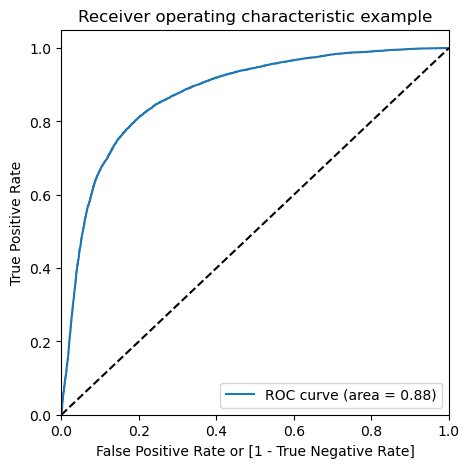

In [797]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

In [798]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.262777,0,1,1,1,0,0,0,0,0,0,0
1,0,0.058347,0,1,0,0,0,0,0,0,0,0,0
2,0,0.385554,0,1,1,1,1,0,0,0,0,0,0
3,0,0.016102,0,1,0,0,0,0,0,0,0,0,0
4,0,0.026044,0,1,0,0,0,0,0,0,0,0,0


In [799]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.649865  0.979353  0.320378
0.2   0.2  0.715557  0.950784  0.480330
0.3   0.3  0.760390  0.919364  0.601415
0.4   0.4  0.787955  0.876696  0.699213
0.5   0.5  0.804140  0.827058  0.781222
0.6   0.6  0.802661  0.754924  0.850399
0.7   0.7  0.777525  0.645667  0.909384
0.8   0.8  0.707741  0.465385  0.950098
0.9   0.9  0.585679  0.191213  0.980145


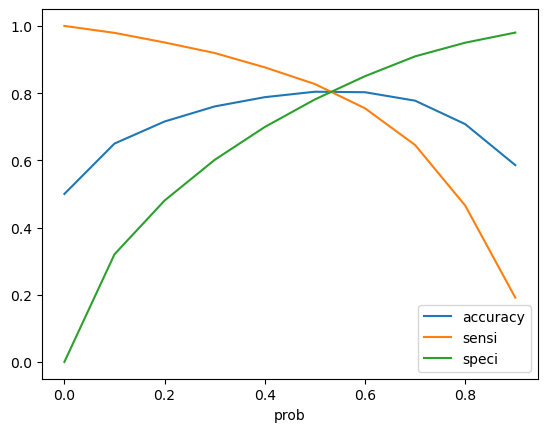

In [800]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

In [801]:
# From the curve 0.5 is the cutoff probabality

In [802]:
from sklearn.metrics import precision_recall_curve

In [803]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

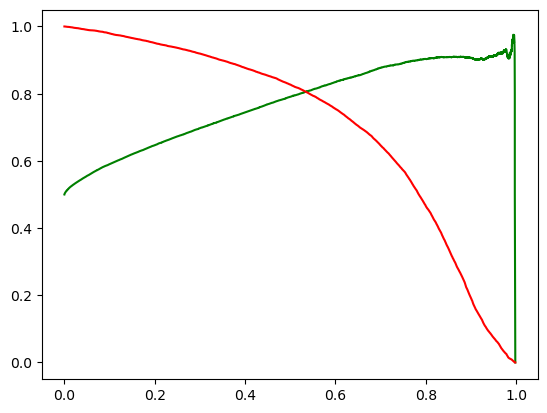

In [804]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [805]:
X_test[cols] = scaler.transform(X_test[cols])

In [817]:
# Doing a train and test split since by mistake the scaler transform is run again
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

In [818]:
# Now running the scaler on fresh test set
X_test[cols] = scaler.transform(X_test[cols])

In [819]:
X_test = X_test[col]
X_test.head()

,onnet_mou_6,onnet_mou_7,offnet_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_8,total_og_mou_8,loc_ic_t2f_mou_7,loc_ic_mou_6,std_ic_mou_6,std_ic_mou_8,ic_others_8,total_rech_num_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_7,vol_3g_mb_8,aon
881,0.135262,0.167186,0.122079,0.114093,0.200848,0.178956,0.133816,0.074816,0.241706,0.283664,0.177177,0.003053,0.415842,0.052402,0.0,0.0,0.0,0.213958
28533,0.020663,0.015564,0.006006,0.000000,0.001716,0.011638,0.013783,0.000000,0.000000,0.020362,0.039337,0.000000,0.059406,0.087336,0.0,0.0,0.0,0.286887
91760,0.406905,0.369481,0.073533,0.034588,0.087482,0.093682,0.272979,0.000000,0.077887,0.068538,0.021958,0.000000,0.316832,0.000000,0.0,0.0,0.0,0.323352
40228,0.044174,0.036502,0.257606,0.000000,0.003874,0.000000,0.004006,0.000000,0.000603,0.005494,0.005733,0.000000,0.198020,0.262009,0.0,0.0,0.0,0.228206
13894,0.261710,0.164424,0.498239,0.009162,0.016908,0.017178,0.101876,0.000000,0.020361,0.002610,0.077808,0.000000,0.099010,0.087336,0.0,0.0,0.0,0.077759


In [820]:
# Adding constant to test data
X_test_sm = sm.add_constant(X_test)

In [821]:
# Predicting using the test data
y_test_pred = res.predict(X_test_sm)

In [822]:
y_pred_1 = pd.DataFrame(y_test_pred)

In [823]:
y_test_df = pd.DataFrame(y_test)

In [824]:
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [825]:
y_pred_final

,churn,0
881,0,0.345639
28533,0,0.622897
91760,0,0.488217
40228,0,0.748282
13894,0,0.912294
...,...,...
91740,0,0.231444
58283,0,0.000815
11630,0,0.121919
72118,0,0.372759


In [826]:
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [827]:
# Using 0.53 as the threshold using the Balance of Precision and Recall
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.53 else 0)

In [828]:
accuracy_score(y_pred_final.churn, y_pred_final.final_predicted)

0.797667167109366

In [829]:
# Metrics of the final model
print(classification_report(y_pred_final.churn, y_pred_final.final_predicted ))

              precision    recall  f1-score   support

           0       0.98      0.80      0.88      8117
           1       0.20      0.76      0.32       542

    accuracy                           0.80      8659
   macro avg       0.59      0.78      0.60      8659
weighted avg       0.93      0.80      0.85      8659



In [834]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37874
Model:                            GLM   Df Residuals:                    37855
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16990.
Date:                Mon, 10 Jul 2023   Deviance:                       33980.
Time:                        10:03:49   Pearson chi2:                 5.53e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3868
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.2139      0.035     34.310      0.000       1.145       1.283
onnet_mou_6            0.9912      0.101      9.771      0.000       0.792       1.190
onnet_mou_7            2.1501      0.120     17.915      0.000       1.915       2.385
offnet_mou_7           3.5307      0.100     35.234      0.000       3.334       3.727
loc_og_t2t_mou_8      -1.9999      0.120    -16.660      0.000      -2.235      -1.765
loc_og_t2m_mou_6      -0.6085      0.140     -4.333      0.000      -0.884      -0.333
loc_og_t2m_mou_8      -3.6734      0.194    -18.938      0.000      -4.054      -3.293
total_og_mou_8        -5.4989      0.163    -33.780      0.000      -5.818      -5.180
loc_ic_t2f_mou_7      -1.2710      0.096    -13.225      0.000      -1.459      -1.083
loc_ic_mou_6           0.2948      0.118      2.507      0.012       0.064       0.525
std_ic_mou_6           1.1919      0.093     12.783      0.000       1.009       1.375
std_ic_mou_8          -2.2877      0.110    -20.836      0.000      -2.503      -2.072
ic_others_8           -0.7093      0.072     -9.872      0.000      -0.850      -0.569
total_rech_num_8      -1.3991      0.108    -12.928      0.000      -1.611      -1.187
last_day_rch_amt_8    -2.2632      0.102    -22.114      0.000      -2.464      -2.063
vol_2g_mb_8           -1.6457      0.079    -20.835      0.000      -1.801      -1.491
vol_3g_mb_7            1.6215      0.110     14.767      0.000       1.406       1.837
vol_3g_mb_8           -3.7100      0.155    -23.994      0.000      -4.013      -3.407
aon                   -1.1194      0.069    -16.167      0.000      -1.255      -0.984
======================================================================================
"""

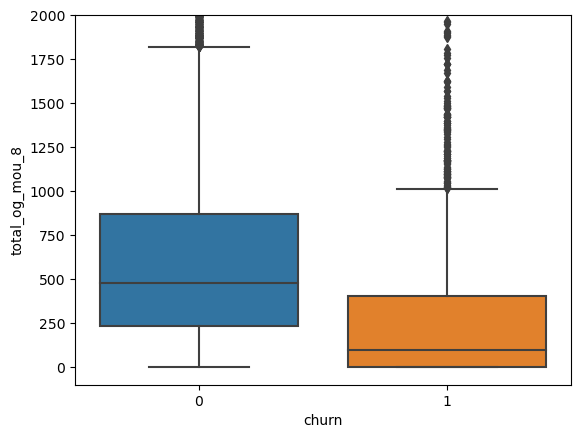

In [833]:
# plotting the box plot of the feature affecting churn according to the logistic regression
sns.boxplot(x= churn.churn, y = churn.total_og_mou_8)
plt.ylim(-100,2000)
plt.show()

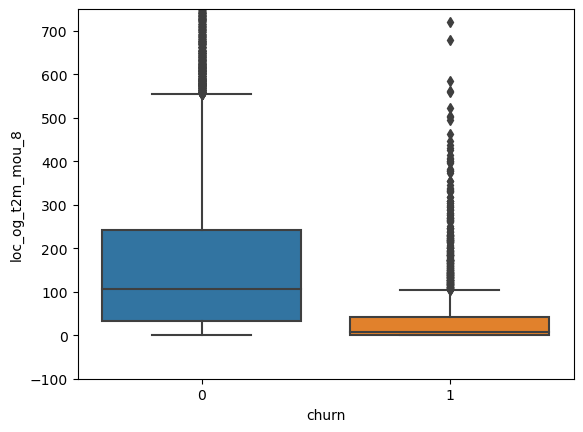

In [836]:
# plotting the box plot of the feature affecting churn according to the logistic regression
sns.boxplot(x= churn.churn, y = churn.loc_og_t2m_mou_8)
plt.ylim(-100,750)
plt.show()

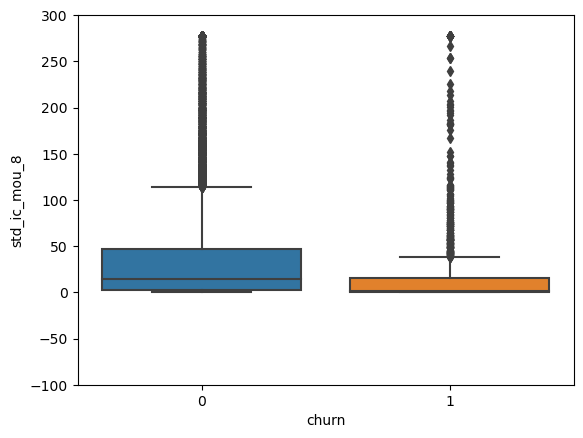

In [838]:
# plotting the box plot of the feature affecting churn according to the logistic regression
sns.boxplot(x= churn.churn, y = churn.std_ic_mou_8)
plt.ylim(-100,300)
plt.show()

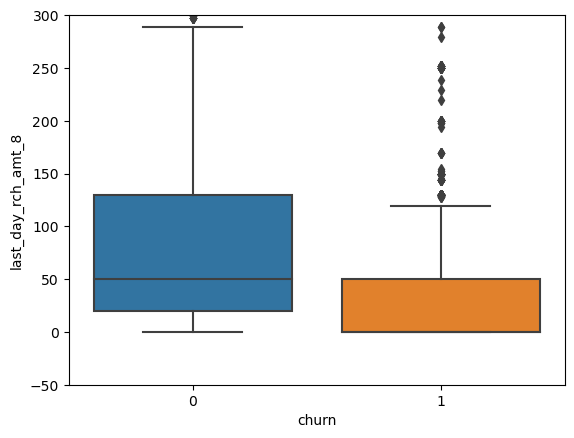

In [864]:
# plotting the box plot of the feature affecting churn according to the logistic regression
sns.boxplot(x= churn.churn, y = churn.last_day_rch_amt_8)
plt.ylim(-50,300)
plt.show()

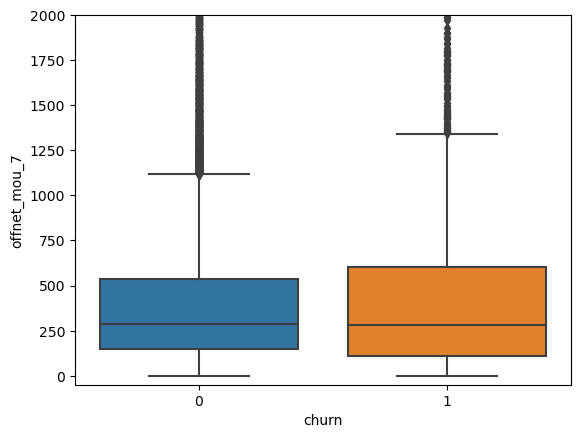

In [871]:
# plotting the box plot of the feature affecting churn according to the logistic regression
sns.boxplot(x= churn.churn, y = churn.offnet_mou_7)
plt.ylim(-50,2000)
plt.show()

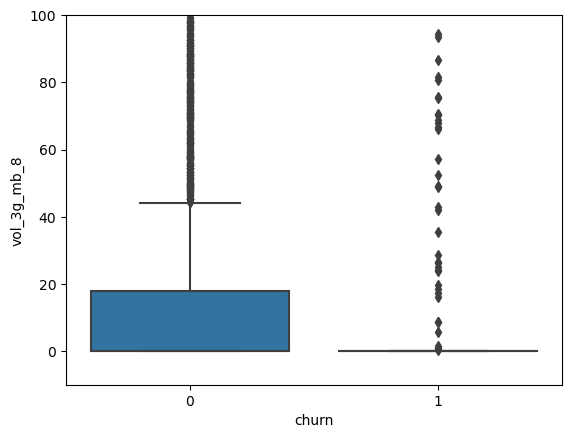

In [869]:
# plotting the box plot of the feature affecting churn according to the logistic regression
sns.boxplot(x= churn.churn, y = churn.vol_3g_mb_8)
plt.ylim(-10,100)
plt.show()

In [846]:
# Creating a Diff parameter to check the influence of the difference between avg of good phase Vs action phase of te most influentential parameters suggested by logistic regression
create_derived_feature_diff('total_og_mou')

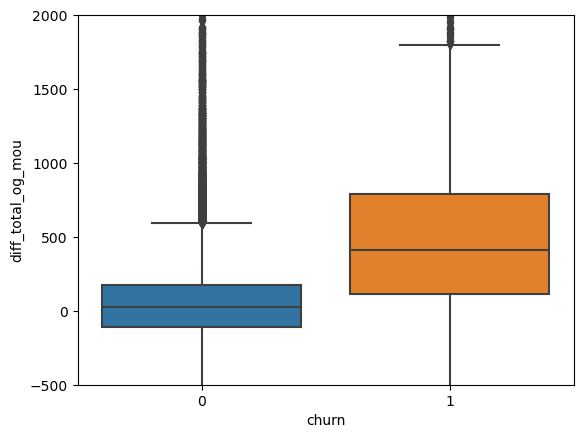

In [848]:
# Plotting the difference as suggested above
sns.boxplot(x= churn.churn, y = churn.diff_total_og_mou)
plt.ylim(-500,2000)
plt.show()

In [849]:
# Creating a Diff parameter to check the influence of the difference between avg of good phase Vs action phase of te most influentential parameters suggested by logistic regression
create_derived_feature_diff('vol_3g_mb')

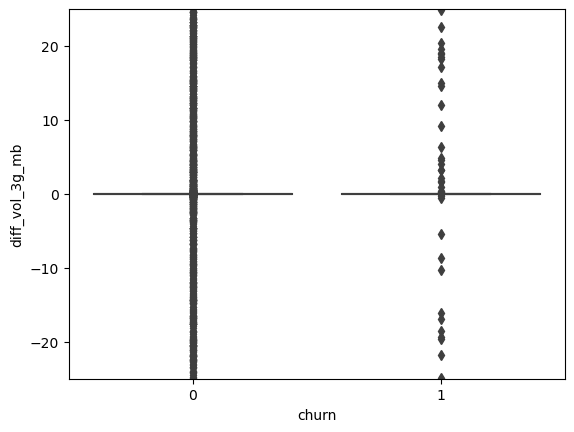

In [853]:
# Plotting the difference as suggested above
sns.boxplot(x= churn.churn, y = churn.diff_vol_3g_mb)
plt.ylim(-25,25)
plt.show()

In [858]:
churn.vol_3g_mb_7.describe()

count    28861.000000
mean       229.035168
std        537.087845
min          0.000000
25%          0.000000
50%          0.000000
75%          2.380000
max       2364.000000
Name: vol_3g_mb_7, dtype: float64

In [859]:
# Creating a Diff parameter to check the influence of the difference between avg of good phase Vs action phase of te most influentential parameters suggested by logistic regression
create_derived_feature_diff('std_ic_mou')

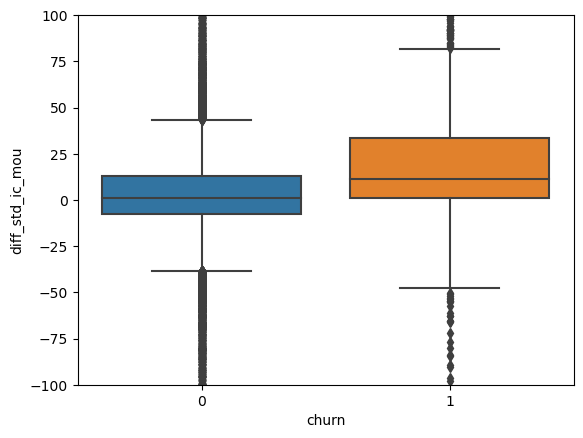

In [862]:
# Plotting the difference as suggested above
sns.boxplot(x= churn.churn, y = churn.diff_std_ic_mou)
plt.ylim(-100,100)
plt.show()

In [865]:
# Creating a Diff parameter to check the influence of the difference between avg of good phase Vs action phase of te most influentential parameters suggested by logistic regression
create_derived_feature_diff('last_day_rch_amt')

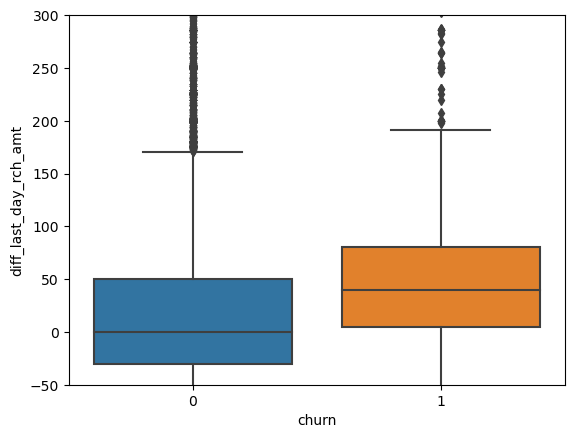

In [867]:
# Plotting the difference as suggested above
sns.boxplot(x= churn.churn, y = churn.diff_last_day_rch_amt)
plt.ylim(-50,300)
plt.show()

In [872]:
# Creating a Diff parameter to check the influence of the difference between avg of good phase Vs action phase of te most influentential parameters suggested by logistic regression
create_derived_feature_diff('loc_og_t2m_mou')

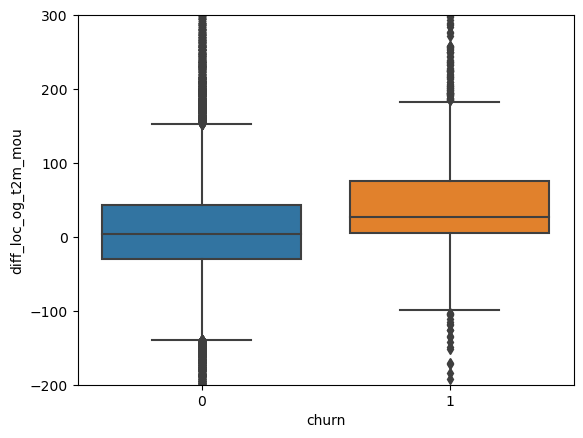

In [875]:
# Plotting the difference as suggested above
sns.boxplot(x= churn.churn, y = churn.diff_loc_og_t2m_mou)
plt.ylim(-200,300)
plt.show()